In [13]:

from pathlib import Path

import cv2
import joblib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score, balanced_accuracy_score, classification_report, confusion_matrix, f1_score
from sklearn.model_selection import GridSearchCV, StratifiedKFold, cross_val_score, train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.svm import SVC
from skimage import measure
from skimage.feature import graycomatrix, graycoprops, local_binary_pattern
from tqdm import tqdm

sns.set_style("whitegrid")
plt.rcParams["figure.figsize"] = (8, 6)
RANDOM_STATE = 42
SCORING_METRIC = "balanced_accuracy"

DATASET_DIR = Path("../data/processed")
CLASS_NAMES = sorted([p.name for p in DATASET_DIR.iterdir() if p.is_dir()])
if not DATASET_DIR.exists():
	print(f"Directory not found: {DATASET_DIR}. Creating it...")
	DATASET_DIR.mkdir(parents=True, exist_ok=True)

MODEL_DIR = Path("../models")
print(f"Kelas yang ditemukan: {CLASS_NAMES}")

Kelas yang ditemukan: ['belum-matang', 'matang', 'setengah-matang']


In [14]:
IMAGE_EXT = {".jpg", ".jpeg", ".png", ".bmp"}

def list_images(class_dir: Path):
    return [p for p in class_dir.glob("**/*") if p.suffix.lower() in IMAGE_EXT]

dataset_overview = []
for cls in CLASS_NAMES:
    files = list_images(DATASET_DIR / cls)
    dataset_overview.append({"label": cls, "jumlah_gambar": len(files)})

df_overview = pd.DataFrame(dataset_overview).sort_values("label")
display(df_overview)
print(f"Total gambar: {df_overview['jumlah_gambar'].sum()}")

sample_listing = {cls: list_images(DATASET_DIR / cls)[:3] for cls in CLASS_NAMES}
for cls, files in sample_listing.items():
    print(f"\nContoh file kelas {cls}:")
    for f in files:
        print(f"- {f.relative_to(DATASET_DIR)}")

,label,jumlah_gambar
0,belum-matang,63
1,matang,60
2,setengah-matang,69


Total gambar: 192

Contoh file kelas belum-matang:
- belum-matang\image (100).jpg
- belum-matang\image (101).jpg
- belum-matang\image (102).jpg

Contoh file kelas matang:
- matang\Copy of image (70).jpg
- matang\Copy of image (71).jpg
- matang\Copy of image (72).jpg

Contoh file kelas setengah-matang:
- setengah-matang\image (1).jpg
- setengah-matang\image (10).jpg
- setengah-matang\image (11).jpg


In [15]:
def resize_image(image, target_size=(224, 224)):
    """Resize gambar ke ukuran target"""
    return cv2.resize(image, target_size, interpolation=cv2.INTER_AREA)

def reduce_noise(image, method='gaussian', kernel_size=5):
    """Reduksi noise dengan Gaussian atau Median filter"""
    if method == 'gaussian':
        return cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)
    elif method == 'median':
        return cv2.medianBlur(image, kernel_size)
    return image

def segment_chili(image):
    """
    Segmentasi cabai dari background menggunakan color-based method
    Fokus pada warna merah, hijau, kuning (karakteristik cabai)
    """
    # Konversi ke HSV
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    
    # Define range untuk warna cabai (merah, hijau, kuning, orange)
    # Range merah (dua range karena merah ada di ujung hue spectrum)
    lower_red1 = np.array([0, 40, 40])
    upper_red1 = np.array([10, 255, 255])
    lower_red2 = np.array([160, 40, 40])
    upper_red2 = np.array([180, 255, 255])
    
    # Range hijau
    lower_green = np.array([35, 40, 40])
    upper_green = np.array([85, 255, 255])
    
    # Range kuning/orange
    lower_yellow = np.array([15, 40, 40])
    upper_yellow = np.array([35, 255, 255])
    
    # Buat mask untuk setiap warna
    mask_red1 = cv2.inRange(hsv, lower_red1, upper_red1)
    mask_red2 = cv2.inRange(hsv, lower_red2, upper_red2)
    mask_green = cv2.inRange(hsv, lower_green, upper_green)
    mask_yellow = cv2.inRange(hsv, lower_yellow, upper_yellow)
    
    # Gabungkan semua mask
    mask = mask_red1 | mask_red2 | mask_green | mask_yellow
    
    # Morfologi untuk membersihkan mask
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=2)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=1)
    
    # Apply mask ke gambar asli
    result = cv2.bitwise_and(image, image, mask=mask)
    
    return result, mask

def convert_color_space(image, target='HSV'):
    """Konversi color space"""
    if target == 'HSV':
        return cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    elif target == 'LAB':
        return cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    elif target == 'GRAY':
        return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return image

def normalize_intensity(image, method='clahe'):
    """Normalisasi intensitas untuk mengatasi variasi pencahayaan"""
    if len(image.shape) == 3:
        # Untuk gambar berwarna, apply pada channel V (HSV) atau L (LAB)
        hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
        h, s, v = cv2.split(hsv)
        
        if method == 'clahe':
            clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
            v = clahe.apply(v)
        elif method == 'histogram_eq':
            v = cv2.equalizeHist(v)
        
        hsv = cv2.merge([h, s, v])
        return cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)
    else:
        # Untuk grayscale
        if method == 'clahe':
            clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
            return clahe.apply(image)
        elif method == 'histogram_eq':
            return cv2.equalizeHist(image)
    return image

def preprocess_pipeline(image_path, target_size=(224, 224), show_steps=False):
    """
    Pipeline preprocessing lengkap untuk klasifikasi kematangan cabai
    
    Returns:
        dict: Dictionary berisi hasil setiap step preprocessing
    """
    # Load image
    original = cv2.imread(str(image_path))
    if original is None:
        raise ValueError(f"Gagal membaca gambar: {image_path}")
    
    results = {'original': original}
    
    # Step 1: Resize
    resized = resize_image(original, target_size)
    results['resized'] = resized
    
    # Step 2: Noise reduction
    denoised = reduce_noise(resized, method='gaussian', kernel_size=5)
    results['denoised'] = denoised
    
    # Step 3: Segmentation
    segmented, mask = segment_chili(denoised)
    results['segmented'] = segmented
    results['mask'] = mask
    
    # Step 4: Normalisasi intensitas
    normalized = normalize_intensity(segmented, method='clahe')
    results['normalized'] = normalized
    
    # Step 5: Konversi ke HSV (untuk ekstraksi fitur)
    hsv = convert_color_space(normalized, target='HSV')
    results['hsv'] = hsv
    
    # Step 6: Grayscale untuk ekstraksi texture features
    gray = convert_color_space(normalized, target='GRAY')
    results['gray'] = gray
    
    return results

# ============================================================================
# VISUALISASI HASIL PREPROCESSING
# ============================================================================

def visualize_preprocessing(image_path, save_path=None):
    """Visualisasi semua step preprocessing"""
    results = preprocess_pipeline(image_path)
    
    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    fig.suptitle(f'Preprocessing Pipeline: {Path(image_path).name}', fontsize=16, fontweight='bold')
    
    # Original
    axes[0, 0].imshow(cv2.cvtColor(results['original'], cv2.COLOR_BGR2RGB))
    axes[0, 0].set_title('1. Original', fontweight='bold')
    axes[0, 0].axis('off')
    
    # Resized
    axes[0, 1].imshow(cv2.cvtColor(results['resized'], cv2.COLOR_BGR2RGB))
    axes[0, 1].set_title('2. Resized (224×224)', fontweight='bold')
    axes[0, 1].axis('off')
    
    # Denoised
    axes[0, 2].imshow(cv2.cvtColor(results['denoised'], cv2.COLOR_BGR2RGB))
    axes[0, 2].set_title('3. Noise Reduction', fontweight='bold')
    axes[0, 2].axis('off')
    
    # Mask
    axes[0, 3].imshow(results['mask'], cmap='gray')
    axes[0, 3].set_title('4. Segmentation Mask', fontweight='bold')
    axes[0, 3].axis('off')
    
    # Segmented
    axes[1, 0].imshow(cv2.cvtColor(results['segmented'], cv2.COLOR_BGR2RGB))
    axes[1, 0].set_title('5. Segmented', fontweight='bold')
    axes[1, 0].axis('off')
    
    # Normalized
    axes[1, 1].imshow(cv2.cvtColor(results['normalized'], cv2.COLOR_BGR2RGB))
    axes[1, 1].set_title('6. CLAHE Normalized', fontweight='bold')
    axes[1, 1].axis('off')
    
    # HSV
    axes[1, 2].imshow(cv2.cvtColor(results['hsv'], cv2.COLOR_HSV2RGB))
    axes[1, 2].set_title('7. HSV Color Space', fontweight='bold')
    axes[1, 2].axis('off')
    
    # Grayscale
    axes[1, 3].imshow(results['gray'], cmap='gray')
    axes[1, 3].set_title('8. Grayscale', fontweight='bold')
    axes[1, 3].axis('off')
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
        print(f"Visualisasi disimpan ke: {save_path}")
    
    plt.show()
    
    return results

# ============================================================================
# VISUALISASI MULTIPLE SAMPLES
# ============================================================================

def visualize_multiple_samples(sample_listing, num_samples=2):
    """
    Visualisasi preprocessing untuk beberapa sample dari setiap kelas
    
    Args:
        sample_listing: Dictionary dengan format {class_name: [list_of_paths]}
        num_samples: Jumlah sample per kelas yang ingin divisualisasi
    """
    for cls, files in sample_listing.items():
        print(f"\n{'='*80}")
        print(f"Preprocessing untuk kelas: {cls}")
        print(f"{'='*80}\n")
        
        # Ambil sample sesuai jumlah yang diminta
        samples = files[:num_samples]
        
        for img_path in samples:
            try:
                visualize_preprocessing(img_path)
            except Exception as e:
                print(f"Error processing {img_path}: {str(e)}")


Memulai visualisasi preprocessing untuk sample images...
Total kelas: 3

KELAS: BELUM-MATANG


Sample 1: image (100).jpg


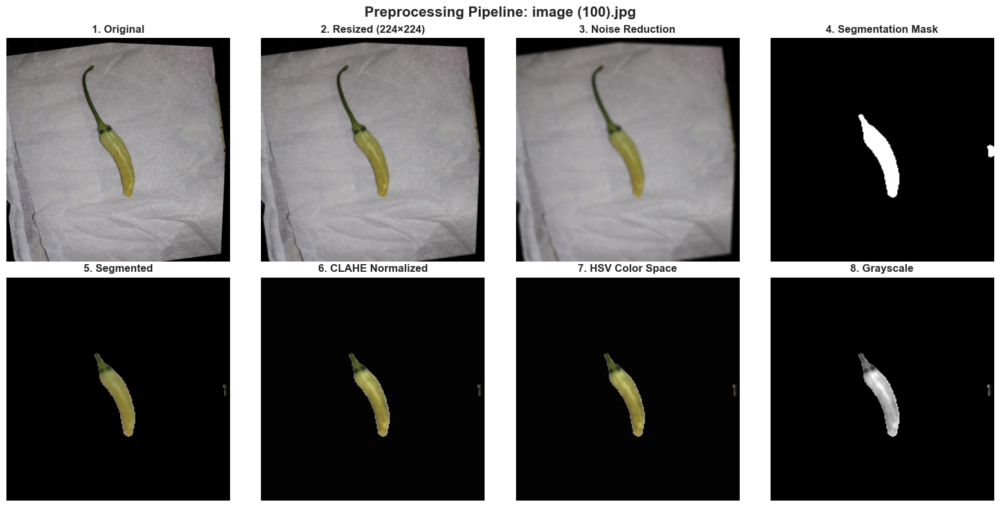

✓ Berhasil diproses

Sample 2: image (101).jpg


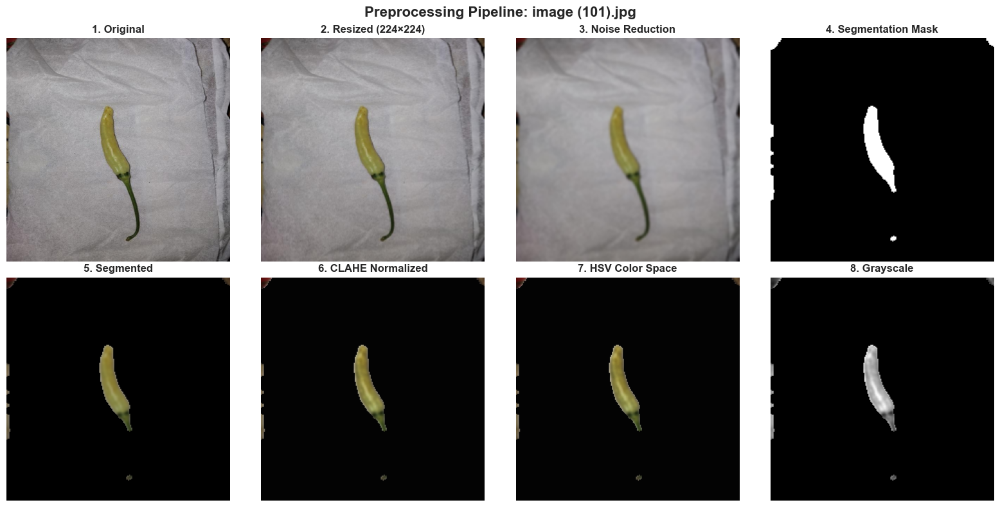

✓ Berhasil diproses

KELAS: MATANG


Sample 1: Copy of image (70).jpg


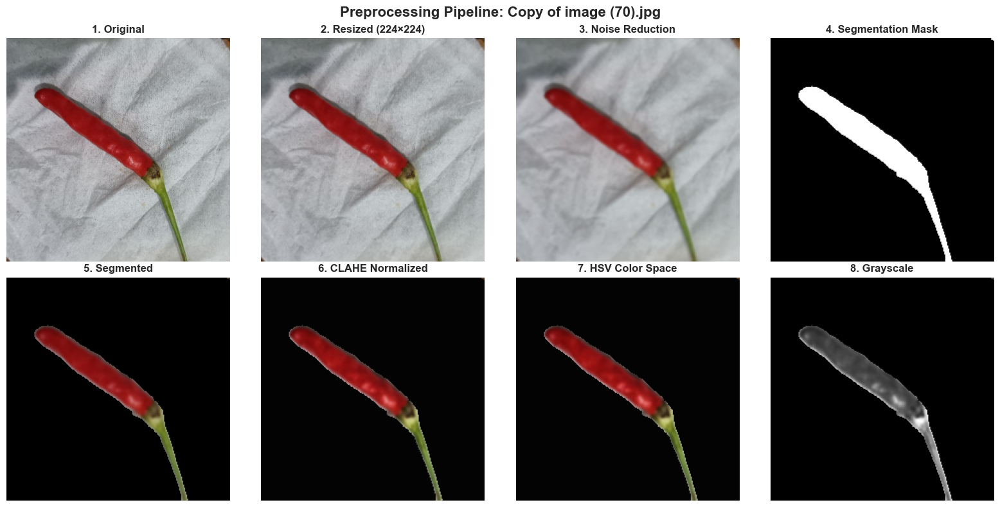

✓ Berhasil diproses

Sample 2: Copy of image (71).jpg


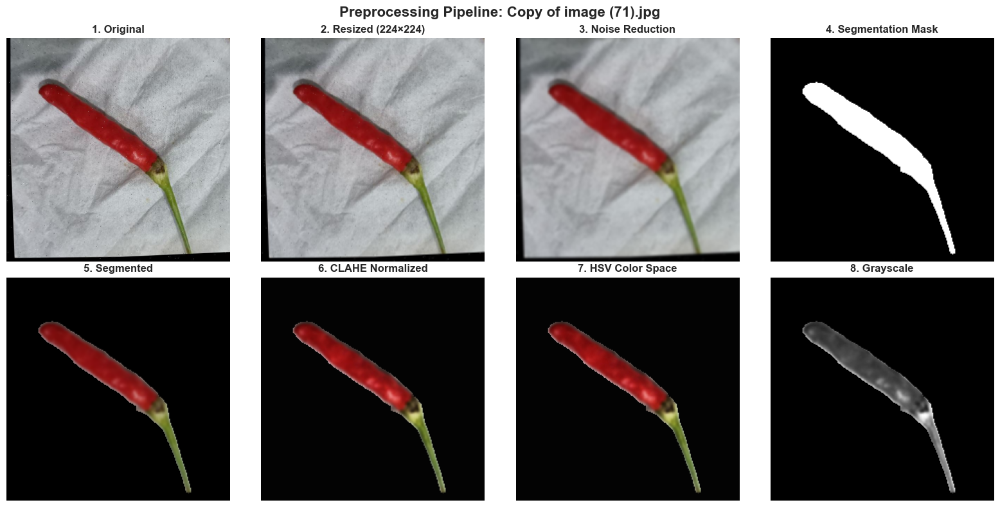

✓ Berhasil diproses

KELAS: SETENGAH-MATANG


Sample 1: image (1).jpg


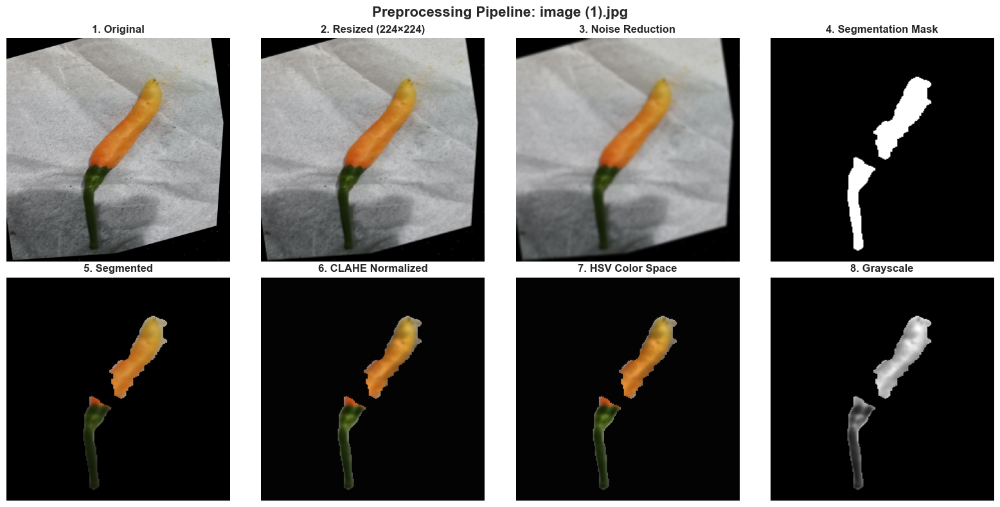

✓ Berhasil diproses

Sample 2: image (10).jpg


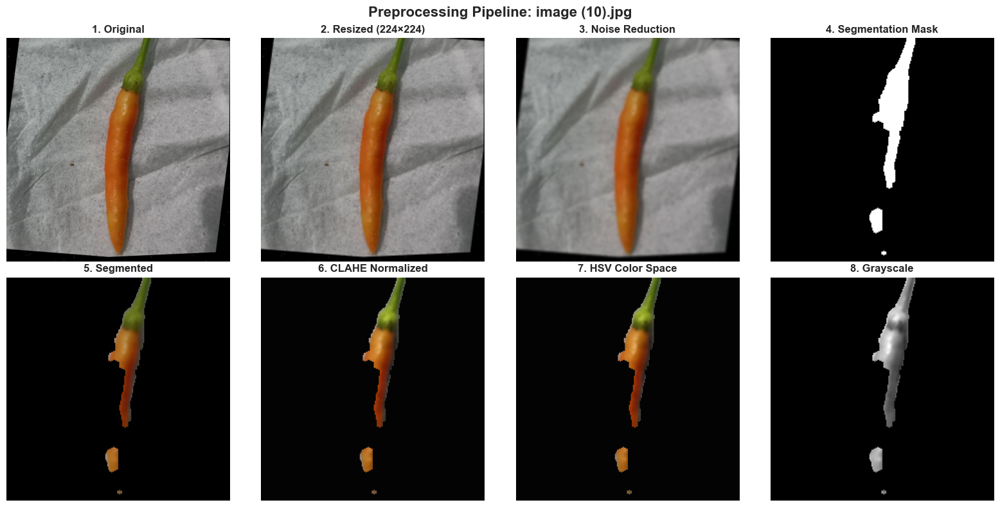

✓ Berhasil diproses


In [16]:
# ============================================================================
# TERAPKAN PREPROCESSING DAN VISUALISASI
# ============================================================================

# Visualisasi preprocessing untuk 2 sample dari setiap kelas
print("Memulai visualisasi preprocessing untuk sample images...")
print(f"Total kelas: {len(CLASS_NAMES)}")

for cls in CLASS_NAMES:
    print(f"\n{'='*80}")
    print(f"KELAS: {cls.upper()}")
    print(f"{'='*80}\n")
    
    # Ambil 2 sample dari setiap kelas
    samples = sample_listing[cls][:2]
    
    for idx, img_path in enumerate(samples, 1):
        print(f"\nSample {idx}: {img_path.name}")
        try:
            results = visualize_preprocessing(img_path)
            print(f"✓ Berhasil diproses")
        except Exception as e:
            print(f"✗ Error: {str(e)}")

In [17]:
# ============================================================================
# ENHANCED FEATURE EXTRACTION
# ============================================================================

def extract_hsv_histogram(hsv_img: np.ndarray, bins: int = 16) -> np.ndarray:
    """Histogram HSV - fitur dasar yang bagus"""
    h_hist = cv2.calcHist([hsv_img], [0], None, [bins], [0, 180])
    s_hist = cv2.calcHist([hsv_img], [1], None, [bins], [0, 256])
    v_hist = cv2.calcHist([hsv_img], [2], None, [bins], [0, 256])
    hist = np.concatenate([h_hist.flatten(), s_hist.flatten(), v_hist.flatten()])
    hist = hist / (hist.sum() + 1e-6)
    return hist.astype(np.float32)


def extract_color_moments(hsv_img: np.ndarray, mask: np.ndarray = None) -> np.ndarray:
    """
    Color moments: mean, std, skewness untuk H, S, V
    Total: 9 features
    """
    features = []
    for i in range(3):
        channel = hsv_img[:, :, i]
        if mask is not None:
            channel = channel[mask > 0]
        
        if len(channel) == 0:
            features.extend([0, 0, 0])
            continue
        
        channel = channel.flatten()
        mean = np.mean(channel)
        std = np.std(channel)
        skewness = np.mean(((channel - mean) / (std + 1e-6)) ** 3)
        features.extend([mean, std, skewness])
    
    return np.array(features, dtype=np.float32)


def extract_color_percentage(hsv_img: np.ndarray, mask: np.ndarray) -> np.ndarray:
    """
    Persentase warna merah, hijau, kuning - SANGAT PENTING untuk kematangan cabai
    Total: 5 features
    """
    h = hsv_img[:, :, 0][mask > 0]
    s = hsv_img[:, :, 1][mask > 0]
    v = hsv_img[:, :, 2][mask > 0]
    
    if len(h) == 0:
        return np.zeros(5, dtype=np.float32)
    
    total_pixels = len(h)
    
    # Merah matang (0-10 dan 160-180 di Hue)
    red_mask = ((h <= 10) | (h >= 160)) & (s > 40) & (v > 40)
    red_pct = red_mask.sum() / total_pixels
    
    # Hijau mentah (35-85)
    green_mask = (h >= 35) & (h <= 85) & (s > 40) & (v > 40)
    green_pct = green_mask.sum() / total_pixels
    
    # Kuning/Orange setengah matang (10-35)
    yellow_mask = (h > 10) & (h < 35) & (s > 40) & (v > 40)
    yellow_pct = yellow_mask.sum() / total_pixels
    
    # Average saturation & value
    avg_saturation = np.mean(s) / 255.0
    avg_value = np.mean(v) / 255.0
    
    return np.array([red_pct, green_pct, yellow_pct, avg_saturation, avg_value], 
                    dtype=np.float32)


def extract_dominant_colors(hsv_img: np.ndarray, mask: np.ndarray, k=3) -> np.ndarray:
    """
    K warna dominan menggunakan K-means
    Total: k * 4 features (H, S, V, proportion)
    """
    pixels = hsv_img.reshape(-1, 3).astype(np.float32)
    mask_flat = mask.reshape(-1)
    
    # Filter pixel background
    pixels = pixels[mask_flat > 0]
    
    if len(pixels) < k:
        return np.zeros(k * 4, dtype=np.float32)
    
    # K-means clustering
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
    _, labels, centers = cv2.kmeans(pixels, k, None, criteria, 10, 
                                     cv2.KMEANS_PP_CENTERS)
    
    # Hitung proporsi setiap cluster
    unique, counts = np.unique(labels, return_counts=True)
    proportions = counts / counts.sum()
    
    # Sort by proportion (descending)
    sorted_idx = np.argsort(proportions)[::-1]
    
    features = []
    for i in range(k):
        if i < len(sorted_idx):
            idx = sorted_idx[i]
            features.extend(centers[idx])
            features.append(proportions[idx])
        else:
            features.extend([0, 0, 0, 0])
    
    return np.array(features, dtype=np.float32)


def extract_glcm_features(gray_img: np.ndarray, mask: np.ndarray) -> np.ndarray:
    """
    GLCM texture features
    Total: 4 properties × 3 distances × 4 angles = 48 features
    """
    masked = cv2.bitwise_and(gray_img, gray_img, mask=mask)
    
    glcm = graycomatrix(
        masked,
        distances=[1, 2, 3],
        angles=[0, np.pi / 4, np.pi / 2, 3 * np.pi / 4],
        levels=256,
        symmetric=True,
        normed=True,
    )
    
    props = []
    for prop in ("contrast", "dissimilarity", "homogeneity", "energy", "correlation"):
        props.extend(graycoprops(glcm, prop).flatten())
    
    return np.array(props, dtype=np.float32)


def extract_lbp_features(gray_img: np.ndarray, mask: np.ndarray, 
                         radius=3, n_points=None) -> np.ndarray:
    """
    Local Binary Pattern - texture features
    Total: n_points + 2 features (default: 26 features)
    """
    if n_points is None:
        n_points = 8 * radius
    
    lbp = local_binary_pattern(gray_img, n_points, radius, method='uniform')
    
    # Hanya hitung histogram pada area yang di-mask
    lbp_masked = lbp[mask > 0]
    if len(lbp_masked) == 0:
        return np.zeros(n_points + 2, dtype=np.float32)
    
    hist, _ = np.histogram(lbp_masked, bins=n_points + 2, 
                           range=(0, n_points + 2), density=True)
    return hist.astype(np.float32)


def extract_ccd_features(mask: np.ndarray, num_points: int = 32) -> np.ndarray:
    """
    Centroid Contour Distance - shape descriptor
    Total: num_points features (default: 32)
    """
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    if not contours:
        return np.zeros(num_points, dtype=np.float32)
    
    cnt = max(contours, key=cv2.contourArea)
    moments = cv2.moments(cnt)
    if moments["m00"] == 0:
        return np.zeros(num_points, dtype=np.float32)

    cx = moments["m10"] / moments["m00"]
    cy = moments["m01"] / moments["m00"]
    centroid = np.array([cx, cy])
    points = cnt.reshape(-1, 2)

    vectors = points - centroid
    radii = np.linalg.norm(vectors, axis=1)
    angles = (np.arctan2(vectors[:, 1], vectors[:, 0]) + 2 * np.pi) % (2 * np.pi)

    bins = np.linspace(0, 2 * np.pi, num_points + 1)
    descriptor = np.zeros(num_points, dtype=np.float32)
    for i in range(num_points):
        mask_angle = (angles >= bins[i]) & (angles < bins[i + 1])
        if np.any(mask_angle):
            descriptor[i] = radii[mask_angle].max()
    
    if descriptor.max() > 0:
        descriptor /= descriptor.max()
    
    return descriptor


def extract_shape_features(mask: np.ndarray) -> np.ndarray:
    """
    Basic shape features
    Total: 6 features
    """
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        return np.zeros(6, dtype=np.float32)
    
    cnt = max(contours, key=cv2.contourArea)
    
    area = cv2.contourArea(cnt)
    perimeter = cv2.arcLength(cnt, True)
    
    # Circularity
    circularity = (4 * np.pi * area) / (perimeter ** 2 + 1e-6)
    
    # Aspect ratio from bounding rectangle
    x, y, w, h = cv2.boundingRect(cnt)
    aspect_ratio = w / (h + 1e-6)
    
    # Extent (area / bounding box area)
    extent = area / (w * h + 1e-6)
    
    # Solidity (area / convex hull area)
    hull = cv2.convexHull(cnt)
    hull_area = cv2.contourArea(hull)
    solidity = area / (hull_area + 1e-6)
    
    return np.array([area, perimeter, circularity, aspect_ratio, extent, solidity],
                    dtype=np.float32)


# ============================================================================
# MAIN FEATURE EXTRACTION FUNCTION
# ============================================================================

def extract_all_features(processed_dict: dict, 
                        use_hsv_hist=True,
                        use_color_moments=True,
                        use_color_percentage=True,
                        use_dominant_colors=True,
                        use_glcm=True,
                        use_lbp=True,
                        use_ccd=True,
                        use_shape=True) -> np.ndarray:
    """
    Ekstrak semua fitur dari gambar yang sudah dipreprocess
    
    Args:
        processed_dict: Output dari preprocess_pipeline()
        use_*: Boolean flags untuk mengaktifkan/nonaktifkan fitur tertentu
    
    Returns:
        Feature vector sebagai numpy array
    """
    features = []
    
    hsv = processed_dict['hsv']
    gray = processed_dict['gray']
    mask = processed_dict['mask']
    
    # 1. HSV Histogram (48 features)
    if use_hsv_hist:
        hsv_hist = extract_hsv_histogram(hsv, bins=16)
        features.append(hsv_hist)
    
    # 2. Color Moments (9 features) - PENTING
    if use_color_moments:
        moments = extract_color_moments(hsv, mask)
        features.append(moments)
    
    # 3. Color Percentage (5 features) - SANGAT PENTING untuk kematangan
    if use_color_percentage:
        color_pct = extract_color_percentage(hsv, mask)
        features.append(color_pct)
    
    # 4. Dominant Colors (12 features)
    if use_dominant_colors:
        dom_colors = extract_dominant_colors(hsv, mask, k=3)
        features.append(dom_colors)
    
    # 5. GLCM Texture (60 features)
    if use_glcm:
        glcm = extract_glcm_features(gray, mask)
        features.append(glcm)
    
    # 6. LBP Texture (26 features)
    if use_lbp:
        lbp = extract_lbp_features(gray, mask)
        features.append(lbp)
    
    # 7. CCD Shape (32 features)
    if use_ccd:
        ccd = extract_ccd_features(mask)
        features.append(ccd)
    
    # 8. Basic Shape Features (6 features)
    if use_shape:
        shape = extract_shape_features(mask)
        features.append(shape)
    
    # Gabungkan semua fitur
    all_features = np.concatenate(features)
    
    return all_features


def extract_features_from_path(image_path: Path, **kwargs) -> np.ndarray:
    """
    Extract features dari path gambar
    
    Args:
        image_path: Path ke file gambar
        **kwargs: Arguments untuk extract_all_features()
    
    Returns:
        Feature vector
    """
    processed = preprocess_pipeline(image_path)
    features = extract_all_features(processed, **kwargs)
    
    return features


# ============================================================================
# UTILITY FUNCTIONS
# ============================================================================

def get_feature_names():
    """Return list nama fitur untuk interpretasi"""
    names = []
    
    # HSV Histogram
    names.extend([f'hsv_hist_{i}' for i in range(48)])
    
    # Color Moments
    for ch in ['H', 'S', 'V']:
        names.extend([f'{ch}_mean', f'{ch}_std', f'{ch}_skew'])
    
    # Color Percentage
    names.extend(['red_pct', 'green_pct', 'yellow_pct', 'avg_sat', 'avg_val'])
    
    # Dominant Colors
    for i in range(3):
        names.extend([f'dom_color{i}_H', f'dom_color{i}_S', 
                     f'dom_color{i}_V', f'dom_color{i}_prop'])
    
    # GLCM
    for prop in ['contrast', 'dissimilarity', 'homogeneity', 'energy', 'correlation']:
        for d in [1, 2, 3]:
            for a in [0, 45, 90, 135]:
                names.append(f'glcm_{prop}_d{d}_a{a}')
    
    # LBP
    names.extend([f'lbp_{i}' for i in range(26)])
    
    # CCD
    names.extend([f'ccd_{i}' for i in range(32)])
    
    # Shape
    names.extend(['area', 'perimeter', 'circularity', 'aspect_ratio', 'extent', 'solidity'])
    
    return names


def print_feature_summary():
    """Print ringkasan jumlah fitur"""
    summary = {
        'HSV Histogram': 48,
        'Color Moments': 9,
        'Color Percentage': 5,
        'Dominant Colors': 12,
        'GLCM Texture': 60,
        'LBP Texture': 26,
        'CCD Shape': 32,
        'Basic Shape': 6
    }
    
    print("=" * 60)
    print("FEATURE EXTRACTION SUMMARY")
    print("=" * 60)
    for name, count in summary.items():
        print(f"{name:.<40} {count:>4} features")
    print("-" * 60)
    print(f"{'TOTAL':.<40} {sum(summary.values()):>4} features")
    print("=" * 60)



## Contoh Vektor Fitur
Verifikasi pipeline dengan mengekstrak fitur dari satu gambar contoh untuk memastikan semua berjalan dengan baik.

In [22]:
import random

# Pilih satu gambar contoh secara acak
sample_path = random.choice(list_images(DATASET_DIR / CLASS_NAMES[0]))
sample_features = extract_features_from_path(sample_path)

print(f"File contoh: {sample_path.relative_to(DATASET_DIR)}")
print(f"Dimensi fitur gabungan: {sample_features.shape[0]}")
print(f"\nContoh nilai fitur (10 pertama):")
print(sample_features[:10])

File contoh: belum-matang\image (84).jpg
Dimensi fitur gabungan: 198

Contoh nilai fitur (10 pertama):
[0.3231824  0.         0.0064772  0.00367374 0.         0.
 0.         0.         0.         0.        ]


## Pembuatan Dataset Fitur
Ekstraksi fitur dari seluruh dataset untuk membuat matrix fitur yang siap digunakan dalam training model.

In [23]:
all_features = []
all_labels = []
all_paths = []

for cls in CLASS_NAMES:
    files = list_images(DATASET_DIR / cls)
    for path in tqdm(files, desc=f"Ekstraksi fitur {cls}"):
        try:
            feats = extract_features_from_path(path)
            all_features.append(feats)
            all_labels.append(cls)
            all_paths.append(path.name)
        except Exception as e:
            print(f"Error processing {path.name}: {str(e)}")
            continue

feature_matrix = np.vstack(all_features)
label_array = np.array(all_labels)

print(f"\n{'='*60}")
print(f"Matrix fitur: {feature_matrix.shape}")
print(f"Total sampel: {len(label_array)}")
print(f"Distribusi kelas:")
for cls in CLASS_NAMES:
    count = (label_array == cls).sum()
    print(f"  - {cls}: {count} sampel")

Ekstraksi fitur setengah-matang: 100%|██████████| 69/69 [00:09<00:00,  7.25it/s]


Matrix fitur: (192, 198)
Total sampel: 192
Distribusi kelas:
  - belum-matang: 63 sampel
  - matang: 60 sampel
  - setengah-matang: 69 sampel


## Pembuatan DataFrame Fitur
Konversi matrix fitur ke DataFrame pandas untuk analisis dan visualisasi lebih mudah.

In [24]:
# Buat nama kolom untuk semua fitur
feature_names = get_feature_names()

# Buat DataFrame
features_df = pd.DataFrame(feature_matrix, columns=feature_names)
features_df["label"] = label_array
features_df["filename"] = all_paths

print("DataFrame Fitur berhasil dibuat!")
print(f"Shape: {features_df.shape}")
print(f"\nContoh 5 baris pertama:")
display(features_df.head())

print(f"\nStatistik deskriptif (5 fitur pertama):")
display(features_df.iloc[:, :5].describe())

DataFrame Fitur berhasil dibuat!
Shape: (192, 200)

Contoh 5 baris pertama:


,hsv_hist_0,hsv_hist_1,hsv_hist_2,hsv_hist_3,hsv_hist_4,hsv_hist_5,hsv_hist_6,hsv_hist_7,hsv_hist_8,hsv_hist_9,...,ccd_30,ccd_31,area,perimeter,circularity,aspect_ratio,extent,solidity,label,filename
0,0.324657,0.000458,0.007062,0.000983,0.0,0.0,0.0,0.0,0.000133,0.0,...,0.236736,0.245512,1162.0,203.823380,0.351486,0.488095,0.337398,0.813156,belum-matang,image (100).jpg
1,0.323681,0.001521,0.007115,0.001003,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.119783,0.132277,1149.5,203.438599,0.349021,0.379310,0.400383,0.809222,belum-matang,image (101).jpg
2,0.325029,0.000252,0.007049,0.001003,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.259770,0.274458,1165.0,199.480225,0.367905,0.589744,0.324693,0.811564,belum-matang,image (102).jpg
3,0.325076,0.001070,0.006019,0.001169,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.084137,0.081041,1001.5,233.521866,0.230784,0.714286,0.198710,0.677147,belum-matang,image (103).jpg
4,0.325182,0.000937,0.005992,0.001149,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.191287,0.200794,999.5,217.521851,0.265453,0.769231,0.213568,0.709368,belum-matang,image (104).jpg



Statistik deskriptif (5 fitur pertama):


,hsv_hist_0,hsv_hist_1,hsv_hist_2,hsv_hist_3,hsv_hist_4
count,192.000000,192.000000,192.000000,192.000000,192.000000
mean,0.320405,0.005542,0.003637,0.002571,0.000062
std,0.009109,0.008568,0.002881,0.001821,0.000152
min,0.291773,0.000000,0.000020,0.000000,0.000000
25%,0.318939,0.000335,0.001280,0.001088,0.000000
50%,0.323441,0.000890,0.002481,0.002485,0.000000
75%,0.326159,0.007540,0.006263,0.003735,0.000027
max,0.331453,0.031914,0.010729,0.009626,0.000850


## Visualisasi Distribusi Fitur Penting
Analisis distribusi beberapa fitur kunci untuk memahami perbedaan antar kelas kematangan.

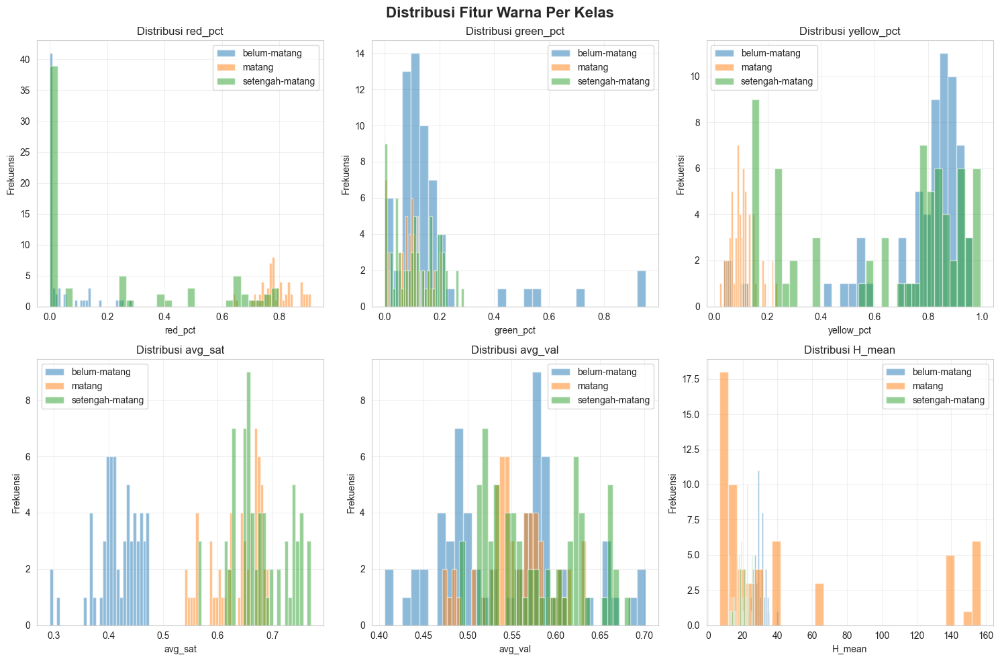

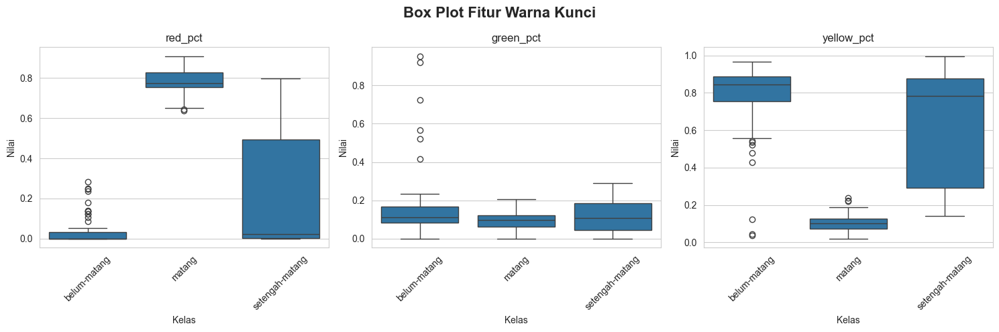

In [25]:
# Visualisasi distribusi fitur warna (sangat penting untuk kematangan)
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Distribusi Fitur Warna Per Kelas', fontsize=16, fontweight='bold')

color_features = ['red_pct', 'green_pct', 'yellow_pct', 'avg_sat', 'avg_val', 'H_mean']

for idx, feature in enumerate(color_features):
    ax = axes[idx // 3, idx % 3]
    
    for cls in CLASS_NAMES:
        data = features_df[features_df['label'] == cls][feature]
        ax.hist(data, alpha=0.5, label=cls, bins=30)
    
    ax.set_xlabel(feature)
    ax.set_ylabel('Frekuensi')
    ax.set_title(f'Distribusi {feature}')
    ax.legend()
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Box plot untuk fitur warna
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
fig.suptitle('Box Plot Fitur Warna Kunci', fontsize=16, fontweight='bold')

key_features = ['red_pct', 'green_pct', 'yellow_pct']

for idx, feature in enumerate(key_features):
    sns.boxplot(data=features_df, x='label', y=feature, ax=axes[idx])
    axes[idx].set_title(f'{feature}')
    axes[idx].set_xlabel('Kelas')
    axes[idx].set_ylabel('Nilai')
    axes[idx].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

## Simpan Dataset Fitur
Simpan dataset fitur ke file untuk keperluan training model selanjutnya.

In [26]:
# Simpan dataset fitur ke file CSV
output_file = MODEL_DIR / "chili_features_dataset.csv"
features_df.to_csv(output_file, index=False)
print(f"Dataset fitur berhasil disimpan ke: {output_file}")
print(f"Ukuran file: {output_file.stat().st_size / 1024:.2f} KB")

# Simpan juga dalam format pickle untuk loading lebih cepat
pickle_file = MODEL_DIR / "chili_features_dataset.pkl"
features_df.to_pickle(pickle_file)
print(f"Dataset fitur (pickle) disimpan ke: {pickle_file}")
print(f"Ukuran file: {pickle_file.stat().st_size / 1024:.2f} KB")

Dataset fitur berhasil disimpan ke: ..\models\chili_features_dataset.csv
Ukuran file: 390.66 KB
Dataset fitur (pickle) disimpan ke: ..\models\chili_features_dataset.pkl
Ukuran file: 158.23 KB


## Persiapan Data untuk Training
Pisahkan fitur dan label, kemudian lakukan encoding label dan normalisasi dengan StandardScaler.

In [27]:
# Pisahkan fitur dan label
X = feature_matrix
y = label_array

# Encode labels ke numerik
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

print("=" * 60)
print("PERSIAPAN DATA")
print("=" * 60)
print(f"Jumlah sampel: {X.shape[0]}")
print(f"Jumlah fitur: {X.shape[1]}")
print(f"Jumlah kelas: {len(CLASS_NAMES)}")
print(f"\nMapping label:")
for idx, cls in enumerate(label_encoder.classes_):
    count = (y_encoded == idx).sum()
    print(f"  {cls} → {idx} ({count} sampel)")

# Split data: 80% training, 20% testing dengan stratified sampling
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, 
    test_size=0.2, 
    random_state=RANDOM_STATE, 
    stratify=y_encoded
)

print(f"\n{'=' * 60}")
print("DATA SPLITTING")
print("=" * 60)
print(f"Training set: {X_train.shape[0]} sampel ({X_train.shape[0]/X.shape[0]*100:.1f}%)")
print(f"Testing set: {X_test.shape[0]} sampel ({X_test.shape[0]/X.shape[0]*100:.1f}%)")

print(f"\nDistribusi kelas di training set:")
for idx, cls in enumerate(label_encoder.classes_):
    count = (y_train == idx).sum()
    print(f"  {cls}: {count} sampel ({count/len(y_train)*100:.1f}%)")

print(f"\nDistribusi kelas di testing set:")
for idx, cls in enumerate(label_encoder.classes_):
    count = (y_test == idx).sum()
    print(f"  {cls}: {count} sampel ({count/len(y_test)*100:.1f}%)")

# Normalisasi dengan StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print(f"\n{'=' * 60}")
print("NORMALISASI (StandardScaler)")
print("=" * 60)
print(f"Mean sebelum scaling (5 fitur pertama): {X_train[:, :5].mean(axis=0)}")
print(f"Std sebelum scaling (5 fitur pertama): {X_train[:, :5].std(axis=0)}")
print(f"\nMean setelah scaling (5 fitur pertama): {X_train_scaled[:, :5].mean(axis=0)}")
print(f"Std setelah scaling (5 fitur pertama): {X_train_scaled[:, :5].std(axis=0)}")
print("\n✓ Data berhasil dinormalisasi!")

PERSIAPAN DATA
Jumlah sampel: 192
Jumlah fitur: 198
Jumlah kelas: 3

Mapping label:
  belum-matang → 0 (63 sampel)
  matang → 1 (60 sampel)
  setengah-matang → 2 (69 sampel)

DATA SPLITTING
Training set: 153 sampel (79.7%)
Testing set: 39 sampel (20.3%)

Distribusi kelas di training set:
  belum-matang: 50 sampel (32.7%)
  matang: 48 sampel (31.4%)
  setengah-matang: 55 sampel (35.9%)

Distribusi kelas di testing set:
  belum-matang: 13 sampel (33.3%)
  matang: 12 sampel (30.8%)
  setengah-matang: 14 sampel (35.9%)

NORMALISASI (StandardScaler)
Mean sebelum scaling (5 fitur pertama): [3.2057571e-01 5.3767590e-03 3.7957465e-03 2.4227567e-03 5.1018662e-05]
Std sebelum scaling (5 fitur pertama): [0.00883069 0.00841565 0.00287645 0.00169084 0.00013181]

Mean setelah scaling (5 fitur pertama): [-8.1810301e-09  3.8957285e-10 -1.9454294e-08 -7.7914573e-09
 -2.4543089e-08]
Std setelah scaling (5 fitur pertama): [1.0000001  1.0000001  0.99999994 1.         0.9999995 ]

✓ Data berhasil dinormali

## Menentukan K Terbaik dengan Metode Elbow
Menggunakan metode Elbow untuk menentukan nilai K optimal untuk model KNN.

Mencari nilai K terbaik dengan metode Elbow...
Testing K dari 1 hingga 30...



Testing K values: 100%|██████████| 30/30 [00:02<00:00, 11.24it/s]


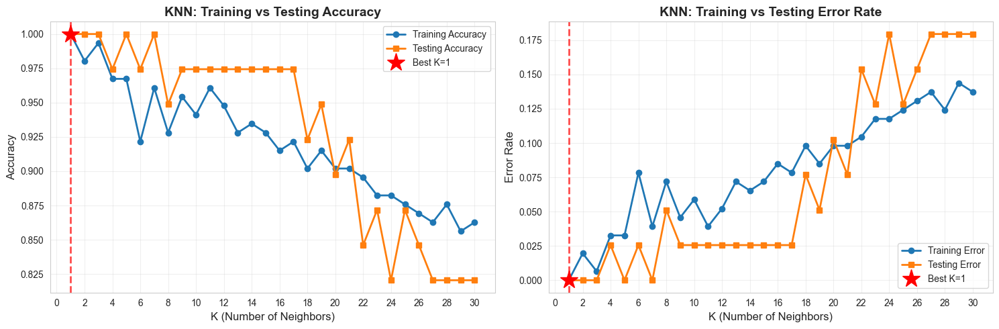


HASIL METODE ELBOW
K terbaik: 1
Testing accuracy pada K=1: 1.0000
Training accuracy pada K=1: 1.0000

Top 5 nilai K berdasarkan testing accuracy:
  1. K=2: 1.0000
  2. K=7: 1.0000
  3. K=1: 1.0000
  4. K=5: 1.0000
  5. K=3: 1.0000


In [28]:
# Metode Elbow untuk menentukan K terbaik
k_range = range(1, 31)
train_scores = []
test_scores = []

print("Mencari nilai K terbaik dengan metode Elbow...")
print("Testing K dari 1 hingga 30...\n")

for k in tqdm(k_range, desc="Testing K values"):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train_scaled, y_train)
    
    train_score = knn.score(X_train_scaled, y_train)
    test_score = knn.score(X_test_scaled, y_test)
    
    train_scores.append(train_score)
    test_scores.append(test_score)

# Visualisasi Elbow Curve
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# Plot 1: Training vs Testing Accuracy
ax1.plot(k_range, train_scores, 'o-', label='Training Accuracy', linewidth=2, markersize=6)
ax1.plot(k_range, test_scores, 's-', label='Testing Accuracy', linewidth=2, markersize=6)
ax1.set_xlabel('K (Number of Neighbors)', fontsize=12)
ax1.set_ylabel('Accuracy', fontsize=12)
ax1.set_title('KNN: Training vs Testing Accuracy', fontsize=14, fontweight='bold')
ax1.legend(fontsize=10)
ax1.grid(True, alpha=0.3)
ax1.set_xticks(range(0, 31, 2))

# Highlight K terbaik
best_k_idx = np.argmax(test_scores)
best_k = list(k_range)[best_k_idx]
best_score = test_scores[best_k_idx]

ax1.axvline(x=best_k, color='red', linestyle='--', alpha=0.7, linewidth=2)
ax1.plot(best_k, best_score, 'r*', markersize=20, label=f'Best K={best_k}')
ax1.legend(fontsize=10)

# Plot 2: Error Rate
train_errors = [1 - score for score in train_scores]
test_errors = [1 - score for score in test_scores]

ax2.plot(k_range, train_errors, 'o-', label='Training Error', linewidth=2, markersize=6)
ax2.plot(k_range, test_errors, 's-', label='Testing Error', linewidth=2, markersize=6)
ax2.set_xlabel('K (Number of Neighbors)', fontsize=12)
ax2.set_ylabel('Error Rate', fontsize=12)
ax2.set_title('KNN: Training vs Testing Error Rate', fontsize=14, fontweight='bold')
ax2.legend(fontsize=10)
ax2.grid(True, alpha=0.3)
ax2.set_xticks(range(0, 31, 2))

ax2.axvline(x=best_k, color='red', linestyle='--', alpha=0.7, linewidth=2)
ax2.plot(best_k, test_errors[best_k_idx], 'r*', markersize=20, label=f'Best K={best_k}')
ax2.legend(fontsize=10)

plt.tight_layout()
plt.show()

# Print hasil
print("\n" + "=" * 60)
print("HASIL METODE ELBOW")
print("=" * 60)
print(f"K terbaik: {best_k}")
print(f"Testing accuracy pada K={best_k}: {best_score:.4f}")
print(f"Training accuracy pada K={best_k}: {train_scores[best_k_idx]:.4f}")

# Top 5 K values
top_5_indices = np.argsort(test_scores)[-5:][::-1]
print(f"\nTop 5 nilai K berdasarkan testing accuracy:")
for i, idx in enumerate(top_5_indices, 1):
    k_val = list(k_range)[idx]
    print(f"  {i}. K={k_val}: {test_scores[idx]:.4f}")

## Training Model KNN dengan K Terbaik
Training model K-Nearest Neighbors dengan nilai K optimal yang telah ditentukan.

TRAINING MODEL KNN (K=1)

Performa pada Training Set:
  Accuracy: 1.0000
  Balanced Accuracy: 1.0000
  F1-Score (weighted): 1.0000

Performa pada Testing Set:
  Accuracy: 1.0000
  Balanced Accuracy: 1.0000
  F1-Score (weighted): 1.0000

CLASSIFICATION REPORT (Testing Set)
                 precision    recall  f1-score   support

   belum-matang     1.0000    1.0000    1.0000        13
         matang     1.0000    1.0000    1.0000        12
setengah-matang     1.0000    1.0000    1.0000        14

       accuracy                         1.0000        39
      macro avg     1.0000    1.0000    1.0000        39
   weighted avg     1.0000    1.0000    1.0000        39



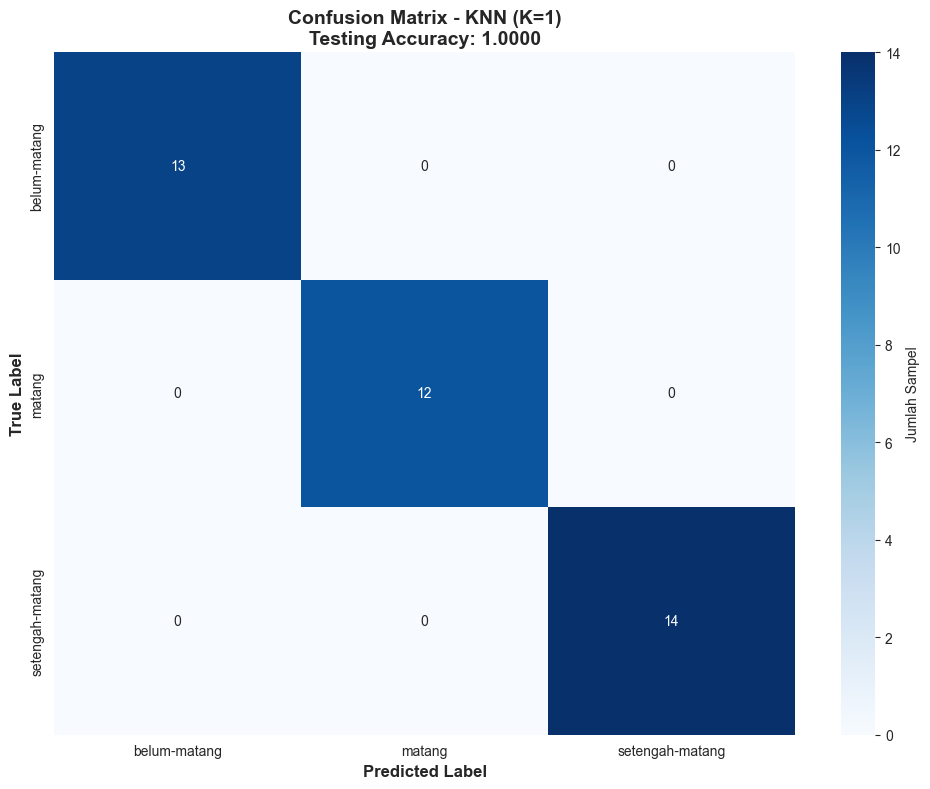


✓ Model KNN berhasil ditraining!


In [ ]:
# Training model KNN dengan K terbaik
print("=" * 60)
print(f"TRAINING MODEL KNN (K={best_k})")
print("=" * 60)

knn_model = KNeighborsClassifier(n_neighbors=7, metric='euclidean')
knn_model.fit(X_train_scaled, y_train)

# Prediksi
y_train_pred_knn = knn_model.predict(X_train_scaled)
y_test_pred_knn = knn_model.predict(X_test_scaled)

# Evaluasi Training Set
train_acc_knn = accuracy_score(y_train, y_train_pred_knn)
train_bal_acc_knn = balanced_accuracy_score(y_train, y_train_pred_knn)
train_f1_knn = f1_score(y_train, y_train_pred_knn, average='weighted')

print(f"\nPerforma pada Training Set:")
print(f"  Accuracy: {train_acc_knn:.4f}")
print(f"  Balanced Accuracy: {train_bal_acc_knn:.4f}")
print(f"  F1-Score (weighted): {train_f1_knn:.4f}")

# Evaluasi Testing Set
test_acc_knn = accuracy_score(y_test, y_test_pred_knn)
test_bal_acc_knn = balanced_accuracy_score(y_test, y_test_pred_knn)
test_f1_knn = f1_score(y_test, y_test_pred_knn, average='weighted')

print(f"\nPerforma pada Testing Set:")
print(f"  Accuracy: {test_acc_knn:.4f}")
print(f"  Balanced Accuracy: {test_bal_acc_knn:.4f}")
print(f"  F1-Score (weighted): {test_f1_knn:.4f}")

# Classification Report
print(f"\n{'=' * 60}")
print("CLASSIFICATION REPORT (Testing Set)")
print("=" * 60)
print(classification_report(y_test, y_test_pred_knn, 
                          target_names=label_encoder.classes_,
                          digits=4))

# Confusion Matrix
cm_knn = confusion_matrix(y_test, y_test_pred_knn)

fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(cm_knn, annot=True, fmt='d', cmap='Blues', 
            xticklabels=label_encoder.classes_,
            yticklabels=label_encoder.classes_,
            cbar_kws={'label': 'Jumlah Sampel'},
            ax=ax)
ax.set_xlabel('Predicted Label', fontsize=12, fontweight='bold')
ax.set_ylabel('True Label', fontsize=12, fontweight='bold')
ax.set_title(f'Confusion Matrix - KNN (K={best_k})\nTesting Accuracy: {test_acc_knn:.4f}', 
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print(f"\n✓ Model KNN berhasil ditraining!")

## Training Model SVM
Training Support Vector Machine dengan hyperparameter tuning menggunakan GridSearchCV.

TRAINING MODEL SVM dengan GridSearchCV

Parameter grid:
  C: [0.1, 1, 10, 100]
  gamma: ['scale', 'auto', 0.001, 0.01, 0.1]
  kernel: ['rbf', 'poly', 'sigmoid']

Total kombinasi: 60
Menggunakan 5-fold cross-validation dengan stratified sampling...

Memulai Grid Search...
Fitting 5 folds for each of 60 candidates, totalling 300 fits

HASIL GRID SEARCH
Best parameters:
  C: 100
  gamma: 0.001
  kernel: sigmoid

Best cross-validation score: 1.0000

EVALUASI MODEL SVM

Performa pada Training Set:
  Accuracy: 1.0000
  Balanced Accuracy: 1.0000
  F1-Score (weighted): 1.0000

Performa pada Testing Set:
  Accuracy: 1.0000
  Balanced Accuracy: 1.0000
  F1-Score (weighted): 1.0000

CLASSIFICATION REPORT (Testing Set)
                 precision    recall  f1-score   support

   belum-matang     1.0000    1.0000    1.0000        13
         matang     1.0000    1.0000    1.0000        12
setengah-matang     1.0000    1.0000    1.0000        14

       accuracy                         1.0000       

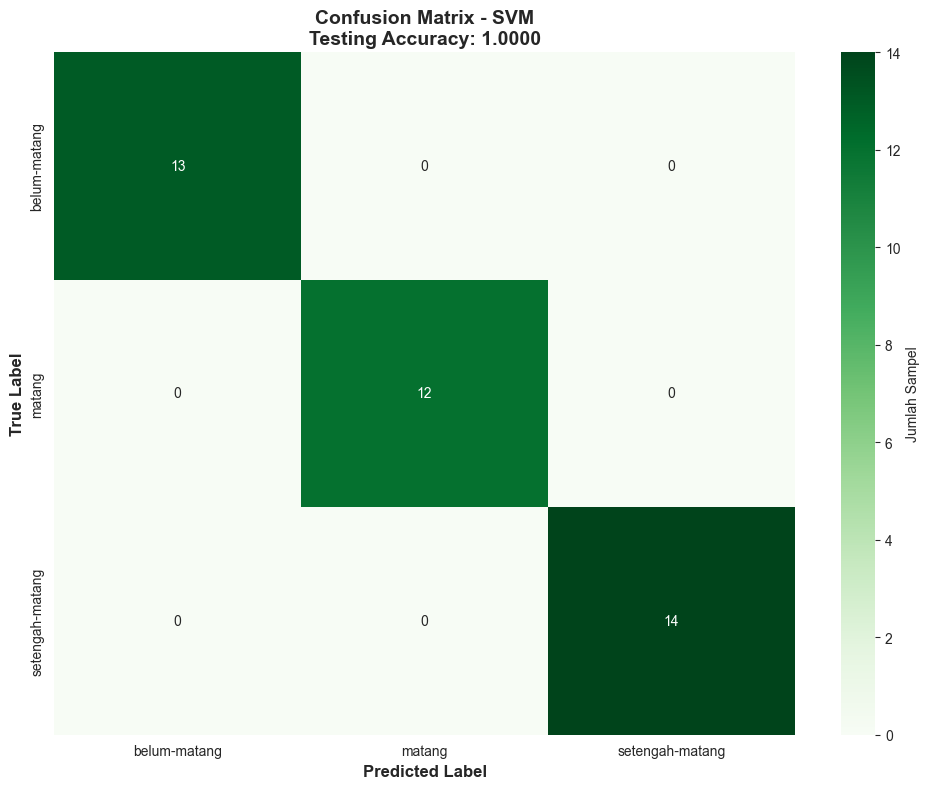


✓ Model SVM berhasil ditraining!


In [ ]:
# Grid Search untuk mencari hyperparameter terbaik SVM
print("=" * 60)
print("TRAINING MODEL SVM dengan GridSearchCV")
print("=" * 60)

# Parameter grid untuk tuning
param_grid = {
    'C': [0.1, 1, 10, 100],
    'gamma': ['scale', 'auto', 0.001, 0.01, 0.1],
    'kernel': ['rbf', 'poly', 'sigmoid']
}

print(f"\nParameter grid:")
for param, values in param_grid.items():
    print(f"  {param}: {values}")

print(f"\nTotal kombinasi: {np.prod([len(v) for v in param_grid.values()])}")
print("Menggunakan 5-fold cross-validation dengan stratified sampling...")

# GridSearchCV dengan 5-fold cross-validation
svm_grid = GridSearchCV(
    SVC(random_state=RANDOM_STATE, C=1.0, kernel='rbf'),
    param_grid,
    cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE),
    scoring=SCORING_METRIC,
    n_jobs=-1,
    verbose=2
)

# Training
print("\nMemulai Grid Search...")
svm_grid.fit(X_train_scaled, y_train)

# Best parameters
print(f"\n{'=' * 60}")
print("HASIL GRID SEARCH")
print("=" * 60)
print(f"Best parameters:")
for param, value in svm_grid.best_params_.items():
    print(f"  {param}: {value}")
print(f"\nBest cross-validation score: {svm_grid.best_score_:.4f}")

# Gunakan model terbaik
svm_model = svm_grid.best_estimator_

# Prediksi
y_train_pred_svm = svm_model.predict(X_train_scaled)
y_test_pred_svm = svm_model.predict(X_test_scaled)

# Evaluasi Training Set
train_acc_svm = accuracy_score(y_train, y_train_pred_svm)
train_bal_acc_svm = balanced_accuracy_score(y_train, y_train_pred_svm)
train_f1_svm = f1_score(y_train, y_train_pred_svm, average='weighted')

print(f"\n{'=' * 60}")
print("EVALUASI MODEL SVM")
print("=" * 60)
print(f"\nPerforma pada Training Set:")
print(f"  Accuracy: {train_acc_svm:.4f}")
print(f"  Balanced Accuracy: {train_bal_acc_svm:.4f}")
print(f"  F1-Score (weighted): {train_f1_svm:.4f}")

# Evaluasi Testing Set
test_acc_svm = accuracy_score(y_test, y_test_pred_svm)
test_bal_acc_svm = balanced_accuracy_score(y_test, y_test_pred_svm)
test_f1_svm = f1_score(y_test, y_test_pred_svm, average='weighted')

print(f"\nPerforma pada Testing Set:")
print(f"  Accuracy: {test_acc_svm:.4f}")
print(f"  Balanced Accuracy: {test_bal_acc_svm:.4f}")
print(f"  F1-Score (weighted): {test_f1_svm:.4f}")

# Classification Report
print(f"\n{'=' * 60}")
print("CLASSIFICATION REPORT (Testing Set)")
print("=" * 60)
print(classification_report(y_test, y_test_pred_svm, 
                          target_names=label_encoder.classes_,
                          digits=4))

# Confusion Matrix
cm_svm = confusion_matrix(y_test, y_test_pred_svm)

fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(cm_svm, annot=True, fmt='d', cmap='Greens', 
            xticklabels=label_encoder.classes_,
            yticklabels=label_encoder.classes_,
            cbar_kws={'label': 'Jumlah Sampel'},
            ax=ax)
ax.set_xlabel('Predicted Label', fontsize=12, fontweight='bold')
ax.set_ylabel('True Label', fontsize=12, fontweight='bold')
ax.set_title(f'Confusion Matrix - SVM\nTesting Accuracy: {test_acc_svm:.4f}', 
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print(f"\n✓ Model SVM berhasil ditraining!")

## Perbandingan Model KNN vs SVM
Membandingkan performa kedua model secara visual dan numerik.

PERBANDINGAN MODEL: KNN vs SVM


,Metric,KNN (Train),KNN (Test),SVM (Train),SVM (Test)
0,Accuracy,1.0,1.0,1.0,1.0
1,Balanced Accuracy,1.0,1.0,1.0,1.0
2,F1-Score (weighted),1.0,1.0,1.0,1.0


C:\Users\Acer\AppData\Local\Temp\ipykernel_9072\852608279.py:85: UserWarning: Glyph 129309 (\N{HANDSHAKE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
c:\Users\Acer\Project\chili-scan\backend\venv\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 129309 (\N{HANDSHAKE}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)


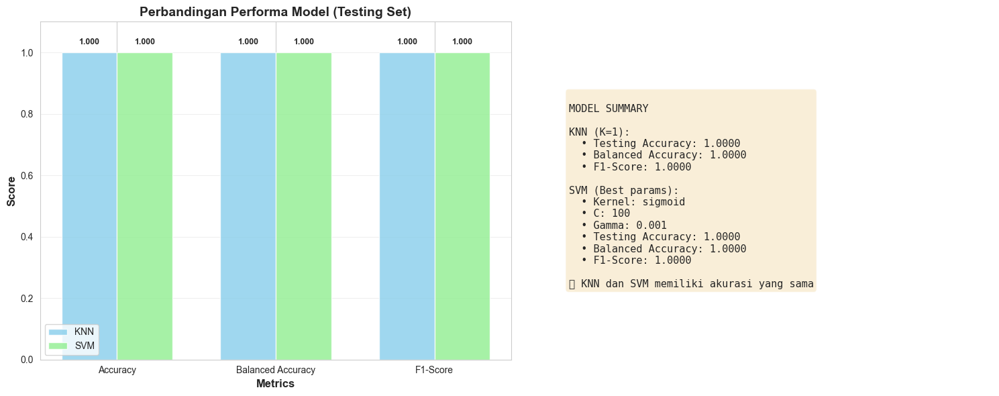


ANALISIS PER-CLASS

Kelas: belum-matang
  KNN: 13/13 correct (100.00%)
  SVM: 13/13 correct (100.00%)
  → Sama-sama baik

Kelas: matang
  KNN: 12/12 correct (100.00%)
  SVM: 12/12 correct (100.00%)
  → Sama-sama baik

Kelas: setengah-matang
  KNN: 14/14 correct (100.00%)
  SVM: 14/14 correct (100.00%)
  → Sama-sama baik


In [31]:
# Tabel perbandingan
comparison_data = {
    'Metric': ['Accuracy', 'Balanced Accuracy', 'F1-Score (weighted)'],
    'KNN (Train)': [train_acc_knn, train_bal_acc_knn, train_f1_knn],
    'KNN (Test)': [test_acc_knn, test_bal_acc_knn, test_f1_knn],
    'SVM (Train)': [train_acc_svm, train_bal_acc_svm, train_f1_svm],
    'SVM (Test)': [test_acc_svm, test_bal_acc_svm, test_f1_svm]
}

comparison_df = pd.DataFrame(comparison_data)
comparison_df = comparison_df.round(4)

print("=" * 80)
print("PERBANDINGAN MODEL: KNN vs SVM")
print("=" * 80)
display(comparison_df)

# Visualisasi perbandingan
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Bar plot perbandingan metrics
metrics = ['Accuracy', 'Balanced Accuracy', 'F1-Score']
x = np.arange(len(metrics))
width = 0.35

ax1 = axes[0]
ax1.bar(x - width/2, comparison_df['KNN (Test)'].values, width, 
        label='KNN', alpha=0.8, color='skyblue')
ax1.bar(x + width/2, comparison_df['SVM (Test)'].values, width, 
        label='SVM', alpha=0.8, color='lightgreen')

ax1.set_xlabel('Metrics', fontsize=12, fontweight='bold')
ax1.set_ylabel('Score', fontsize=12, fontweight='bold')
ax1.set_title('Perbandingan Performa Model (Testing Set)', fontsize=14, fontweight='bold')
ax1.set_xticks(x)
ax1.set_xticklabels(metrics)
ax1.legend()
ax1.grid(True, alpha=0.3, axis='y')
ax1.set_ylim([0, 1.1])

# Tambahkan nilai di atas bar
for i, (knn_val, svm_val) in enumerate(zip(comparison_df['KNN (Test)'], 
                                            comparison_df['SVM (Test)'])):
    ax1.text(i - width/2, knn_val + 0.02, f'{knn_val:.3f}', 
             ha='center', va='bottom', fontweight='bold', fontsize=9)
    ax1.text(i + width/2, svm_val + 0.02, f'{svm_val:.3f}', 
             ha='center', va='bottom', fontweight='bold', fontsize=9)

# Confusion matrices side by side
ax2 = axes[1]
ax2.axis('off')

# Buat tabel summary
summary_text = f"""
MODEL SUMMARY

KNN (K={best_k}):
  • Testing Accuracy: {test_acc_knn:.4f}
  • Balanced Accuracy: {test_bal_acc_knn:.4f}
  • F1-Score: {test_f1_knn:.4f}

SVM (Best params):
  • Kernel: {svm_grid.best_params_['kernel']}
  • C: {svm_grid.best_params_['C']}
  • Gamma: {svm_grid.best_params_['gamma']}
  • Testing Accuracy: {test_acc_svm:.4f}
  • Balanced Accuracy: {test_bal_acc_svm:.4f}
  • F1-Score: {test_f1_svm:.4f}

"""

if test_acc_knn > test_acc_svm:
    winner = f"🏆 KNN menang dengan selisih {(test_acc_knn - test_acc_svm)*100:.2f}%"
elif test_acc_svm > test_acc_knn:
    winner = f"🏆 SVM menang dengan selisih {(test_acc_svm - test_acc_knn)*100:.2f}%"
else:
    winner = "🤝 KNN dan SVM memiliki akurasi yang sama"

summary_text += winner

ax2.text(0.1, 0.5, summary_text, fontsize=11, family='monospace',
         verticalalignment='center', bbox=dict(boxstyle='round', 
         facecolor='wheat', alpha=0.5))

plt.tight_layout()
plt.show()

# Analisis per-class
print("\n" + "=" * 80)
print("ANALISIS PER-CLASS")
print("=" * 80)

for i, class_name in enumerate(label_encoder.classes_):
    knn_correct = cm_knn[i, i]
    knn_total = cm_knn[i, :].sum()
    svm_correct = cm_svm[i, i]
    svm_total = cm_svm[i, :].sum()
    
    print(f"\nKelas: {class_name}")
    print(f"  KNN: {knn_correct}/{knn_total} correct ({knn_correct/knn_total*100:.2f}%)")
    print(f"  SVM: {svm_correct}/{svm_total} correct ({svm_correct/svm_total*100:.2f}%)")
    
    if knn_correct/knn_total > svm_correct/svm_total:
        print(f"  → KNN lebih baik pada kelas ini")
    elif svm_correct/svm_total > knn_correct/knn_total:
        print(f"  → SVM lebih baik pada kelas ini")
    else:
        print(f"  → Sama-sama baik")

## Simpan Model Terbaik
Menyimpan model, scaler, dan label encoder untuk deployment.

In [32]:
# Tentukan model terbaik
if test_acc_svm > test_acc_knn:
    best_model = svm_model
    best_model_name = 'SVM'
    best_accuracy = test_acc_svm
else:
    best_model = knn_model
    best_model_name = 'KNN'
    best_accuracy = test_acc_knn

print("=" * 60)
print("MENYIMPAN MODEL")
print("=" * 60)
print(f"\nModel terbaik: {best_model_name}")
print(f"Testing accuracy: {best_accuracy:.4f}")

# Simpan semua model dan preprocessing objects
models_to_save = {
    'knn_model': knn_model,
    'svm_model': svm_model,
    'best_model': best_model,
    'scaler': scaler,
    'label_encoder': label_encoder,
    'best_k': best_k,
    'best_model_name': best_model_name,
    'class_names': CLASS_NAMES
}

# Simpan ke file pickle
model_file = MODEL_DIR / 'chili_classification_models.pkl'
joblib.dump(models_to_save, model_file)
print(f"\n✓ Semua model disimpan ke: {model_file}")
print(f"  Ukuran file: {model_file.stat().st_size / 1024:.2f} KB")

# Simpan model individual untuk deployment
knn_file = MODEL_DIR / f'knn_model_k{best_k}.pkl'
joblib.dump(knn_model, knn_file)
print(f"\n✓ KNN model disimpan ke: {knn_file}")

svm_file = MODEL_DIR / 'svm_model.pkl'
joblib.dump(svm_model, svm_file)
print(f"✓ SVM model disimpan ke: {svm_file}")

scaler_file = MODEL_DIR / 'scaler.pkl'
joblib.dump(scaler, scaler_file)
print(f"✓ Scaler disimpan ke: {scaler_file}")

encoder_file = MODEL_DIR / 'label_encoder.pkl'
joblib.dump(label_encoder, encoder_file)
print(f"✓ Label encoder disimpan ke: {encoder_file}")

# Simpan metadata
metadata = {
    'best_model': best_model_name,
    'best_k': best_k if best_model_name == 'KNN' else None,
    'svm_params': svm_grid.best_params_ if best_model_name == 'SVM' else None,
    'test_accuracy_knn': test_acc_knn,
    'test_accuracy_svm': test_acc_svm,
    'balanced_accuracy_knn': test_bal_acc_knn,
    'balanced_accuracy_svm': test_bal_acc_svm,
    'f1_score_knn': test_f1_knn,
    'f1_score_svm': test_f1_svm,
    'num_features': X.shape[1],
    'num_samples': X.shape[0],
    'class_names': CLASS_NAMES,
    'random_state': RANDOM_STATE
}

metadata_file = MODEL_DIR / 'model_metadata.pkl'
joblib.dump(metadata, metadata_file)
print(f"✓ Metadata disimpan ke: {metadata_file}")

print(f"\n{'=' * 60}")
print("SEMUA MODEL BERHASIL DISIMPAN!")
print("=" * 60)

MENYIMPAN MODEL

Model terbaik: KNN
Testing accuracy: 1.0000

✓ Semua model disimpan ke: ..\models\chili_classification_models.pkl
  Ukuran file: 211.07 KB

✓ KNN model disimpan ke: ..\models\knn_model_k1.pkl
✓ SVM model disimpan ke: ..\models\svm_model.pkl
✓ Scaler disimpan ke: ..\models\scaler.pkl
✓ Label encoder disimpan ke: ..\models\label_encoder.pkl
✓ Metadata disimpan ke: ..\models\model_metadata.pkl

SEMUA MODEL BERHASIL DISIMPAN!


## Prediksi Gambar Test
Menguji model KNN dan SVM pada gambar-gambar baru untuk melihat performa klasifikasi.

In [33]:
# List gambar test
test_images = [
    Path("../data/example/cabai-matang.jpeg"),
    Path("../data/example/cabai-setengah-matang.jpeg"),
    Path("../data/example/tomat-matang.jpeg"),
    Path("../data/example/tomat-belum-matang.jpeg"),
    Path("../data/example/carolina-matang.jpeg"),
    Path("../data/example/carolina-stengah-matang.jpeg"),
    Path("../data/example/cabai-dataset-matang.jpg"),
    Path("../data/example/cabai-dataset-setengah-matang.jpg"),
    Path("../data/example/cabai-dataset-belum-matang.jpg"),
    Path("../data/example/penghapus.png"),
]

print("=" * 80)
print("PREDIKSI GAMBAR TEST")
print("=" * 80)
print(f"\nTotal gambar test: {len(test_images)}")
print("\nMemproses gambar...")

# Siapkan data untuk tabel
prediction_results = []

for img_path in tqdm(test_images, desc="Predicting"):
    try:
        # Ekstrak fitur dari gambar
        features = extract_features_from_path(img_path)
        
        # Normalisasi
        features_scaled = scaler.transform(features.reshape(1, -1))
        
        # Prediksi KNN
        knn_pred_encoded = knn_model.predict(features_scaled)[0]
        knn_pred_label = label_encoder.inverse_transform([knn_pred_encoded])[0]
        knn_proba = knn_model.predict_proba(features_scaled)[0]
        knn_confidence = knn_proba.max() * 100
        
        # Prediksi SVM
        svm_pred_encoded = svm_model.predict(features_scaled)[0]
        svm_pred_label = label_encoder.inverse_transform([svm_pred_encoded])[0]
        
        # SVM decision function untuk confidence
        svm_decision = svm_model.decision_function(features_scaled)[0]
        # Konversi ke probabilitas menggunakan softmax-like approach
        exp_scores = np.exp(svm_decision - np.max(svm_decision))
        svm_proba = exp_scores / exp_scores.sum()
        svm_confidence = svm_proba.max() * 100
        
        # Tambahkan ke hasil
        prediction_results.append({
            'Filename': img_path.name,
            'KNN Prediction': knn_pred_label,
            'KNN Confidence (%)': f'{knn_confidence:.2f}',
            'SVM Prediction': svm_pred_label,
            'SVM Confidence (%)': f'{svm_confidence:.2f}',
            'Agreement': '✓' if knn_pred_label == svm_pred_label else '✗',
            'Path': img_path
        })
        
    except Exception as e:
        prediction_results.append({
            'Filename': img_path.name,
            'KNN Prediction': 'ERROR',
            'KNN Confidence (%)': '-',
            'SVM Prediction': 'ERROR',
            'SVM Confidence (%)': '-',
            'Agreement': '-',
            'Path': img_path
        })
        print(f"\n⚠ Error processing {img_path.name}: {str(e)}")

# Buat DataFrame
predictions_df = pd.DataFrame(prediction_results)

print("\n" + "=" * 80)
print("HASIL PREDIKSI")
print("=" * 80)
display(predictions_df[['Filename', 'KNN Prediction', 'KNN Confidence (%)', 
                        'SVM Prediction', 'SVM Confidence (%)', 'Agreement']])

# Statistik agreement
agreement_count = (predictions_df['Agreement'] == '✓').sum()
total_valid = (predictions_df['Agreement'] != '-').sum()

print(f"\n{'=' * 80}")
print("STATISTIK PREDIKSI")
print("=" * 80)
print(f"Total gambar diproses: {len(test_images)}")
print(f"Prediksi berhasil: {total_valid}")
print(f"KNN & SVM setuju: {agreement_count}/{total_valid} ({agreement_count/total_valid*100:.1f}%)")
print(f"KNN & SVM tidak setuju: {total_valid - agreement_count}/{total_valid}")

# Hitung distribusi prediksi per model
print(f"\n{'=' * 80}")
print("DISTRIBUSI PREDIKSI")
print("=" * 80)

print("\nKNN Predictions:")
knn_dist = predictions_df[predictions_df['KNN Prediction'] != 'ERROR']['KNN Prediction'].value_counts()
for label, count in knn_dist.items():
    print(f"  {label}: {count}")

print("\nSVM Predictions:")
svm_dist = predictions_df[predictions_df['SVM Prediction'] != 'ERROR']['SVM Prediction'].value_counts()
for label, count in svm_dist.items():
    print(f"  {label}: {count}")

PREDIKSI GAMBAR TEST

Total gambar test: 10

Memproses gambar...


Predicting: 100%|██████████| 10/10 [00:01<00:00,  6.10it/s]


HASIL PREDIKSI


,Filename,KNN Prediction,KNN Confidence (%),SVM Prediction,SVM Confidence (%),Agreement
0,cabai-matang.jpeg,setengah-matang,100.00,setengah-matang,70.22,✓
1,cabai-setengah-matang.jpeg,setengah-matang,100.00,matang,78.10,✗
2,tomat-matang.jpeg,setengah-matang,100.00,matang,68.07,✗
3,tomat-belum-matang.jpeg,setengah-matang,100.00,setengah-matang,76.48,✓
4,carolina-matang.jpeg,belum-matang,100.00,setengah-matang,78.07,✗
5,carolina-stengah-matang.jpeg,setengah-matang,100.00,setengah-matang,78.66,✓
6,cabai-dataset-matang.jpg,matang,100.00,matang,71.73,✓
7,cabai-dataset-setengah-matang.jpg,setengah-matang,100.00,setengah-matang,74.75,✓
8,cabai-dataset-belum-matang.jpg,belum-matang,100.00,belum-matang,71.08,✓
9,penghapus.png,belum-matang,100.00,belum-matang,66.51,✓



STATISTIK PREDIKSI
Total gambar diproses: 10
Prediksi berhasil: 10
KNN & SVM setuju: 7/10 (70.0%)
KNN & SVM tidak setuju: 3/10

DISTRIBUSI PREDIKSI

KNN Predictions:
  setengah-matang: 6
  belum-matang: 3
  matang: 1

SVM Predictions:
  setengah-matang: 5
  matang: 3
  belum-matang: 2


## Visualisasi Prediksi
Menampilkan gambar beserta hasil prediksi dari kedua model.

C:\Users\Acer\AppData\Local\Temp\ipykernel_9072\2939289568.py:49: UserWarning: Glyph 10003 (\N{CHECK MARK}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\Acer\AppData\Local\Temp\ipykernel_9072\2939289568.py:49: UserWarning: Glyph 10007 (\N{BALLOT X}) missing from font(s) Arial.
  plt.tight_layout()
c:\Users\Acer\Project\chili-scan\backend\venv\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 10003 (\N{CHECK MARK}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\Acer\Project\chili-scan\backend\venv\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 10007 (\N{BALLOT X}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


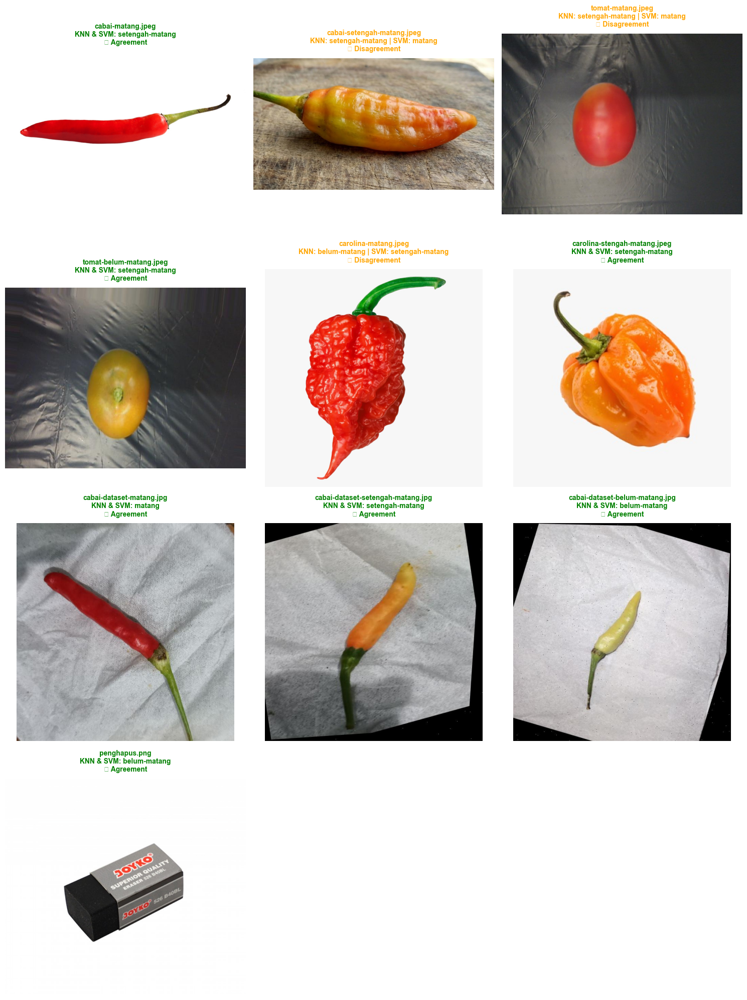


✓ Visualisasi prediksi selesai!


In [34]:
# Visualisasi gambar dengan prediksi
num_images = len(prediction_results)
cols = 3
rows = (num_images + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 5))
axes = axes.flatten() if num_images > 1 else [axes]

for idx, result in enumerate(prediction_results):
    ax = axes[idx]
    
    try:
        # Load dan tampilkan gambar
        img = cv2.imread(str(result['Path']))
        if img is not None:
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            ax.imshow(img_rgb)
        else:
            ax.text(0.5, 0.5, 'Image not found', ha='center', va='center')
            ax.set_xlim(0, 1)
            ax.set_ylim(0, 1)
    except:
        ax.text(0.5, 0.5, 'Error loading image', ha='center', va='center')
        ax.set_xlim(0, 1)
        ax.set_ylim(0, 1)
    
    # Title dengan prediksi
    knn_pred = result['KNN Prediction']
    svm_pred = result['SVM Prediction']
    agreement = result['Agreement']
    
    if knn_pred == 'ERROR':
        title = f"{result['Filename']}\n⚠ Processing Error"
        color = 'red'
    elif agreement == '✓':
        title = f"{result['Filename']}\nKNN & SVM: {knn_pred}\n{agreement} Agreement"
        color = 'green'
    else:
        title = f"{result['Filename']}\nKNN: {knn_pred} | SVM: {svm_pred}\n{agreement} Disagreement"
        color = 'orange'
    
    ax.set_title(title, fontsize=10, fontweight='bold', color=color, pad=10)
    ax.axis('off')

# Hide extra subplots
for idx in range(num_images, len(axes)):
    axes[idx].axis('off')

plt.tight_layout()
plt.show()

print("\n✓ Visualisasi prediksi selesai!")

## 🔍 Analisis Mendalam: Mengapa Prediksi Salah?
Menganalisis penyebab kesalahan prediksi dengan membandingkan fitur test images vs training data.

In [35]:
# Ekstrak fitur warna untuk analisis
print("=" * 80)
print("ANALISIS FITUR WARNA: TEST vs TRAINING DATA")
print("=" * 80)

# Ekstrak fitur untuk test images
test_features_analysis = []

for result in prediction_results:
    if result['KNN Prediction'] != 'ERROR':
        try:
            features = extract_features_from_path(result['Path'])
            
            # Ambil fitur warna penting (index 48-62 berdasarkan get_feature_names)
            # Index 48-56: Color moments (H_mean, H_std, H_skew, S_mean, S_std, S_skew, V_mean, V_std, V_skew)
            # Index 57-61: Color percentage (red_pct, green_pct, yellow_pct, avg_sat, avg_val)
            
            color_moments = features[48:57]
            color_pct = features[57:62]
            
            test_features_analysis.append({
                'filename': result['Filename'],
                'knn_pred': result['KNN Prediction'],
                'svm_pred': result['SVM Prediction'],
                'agreement': result['Agreement'],
                'H_mean': color_moments[0],
                'S_mean': color_moments[3],
                'V_mean': color_moments[6],
                'red_pct': color_pct[0],
                'green_pct': color_pct[1],
                'yellow_pct': color_pct[2],
                'avg_sat': color_pct[3],
                'avg_val': color_pct[4]
            })
        except:
            pass

test_color_df = pd.DataFrame(test_features_analysis)

print("\n📊 FITUR WARNA TEST IMAGES:")
display(test_color_df)

# Bandingkan dengan training data
print("\n\n📊 STATISTIK FITUR WARNA TRAINING DATA PER KELAS:")
color_features_idx = ['H_mean', 'S_mean', 'V_mean', 'red_pct', 'green_pct', 'yellow_pct']

for cls in CLASS_NAMES:
    print(f"\n{'='*60}")
    print(f"Kelas: {cls.upper()}")
    print(f"{'='*60}")
    cls_data = features_df[features_df['label'] == cls]
    
    stats = cls_data[color_features_idx].describe().loc[['mean', 'std', 'min', 'max']]
    display(stats)

print("\n\n" + "=" * 80)
print("KESIMPULAN ANALISIS")
print("=" * 80)

ANALISIS FITUR WARNA: TEST vs TRAINING DATA

📊 FITUR WARNA TEST IMAGES:


,filename,knn_pred,svm_pred,agreement,H_mean,S_mean,V_mean,red_pct,green_pct,yellow_pct,avg_sat,avg_val
0,cabai-matang.jpeg,setengah-matang,setengah-matang,✓,117.515961,213.362671,180.081528,0.913600,0.002033,0.083757,0.836716,0.706202
1,cabai-setengah-matang.jpeg,setengah-matang,matang,✗,16.868401,108.424294,154.799759,0.051520,0.002858,0.888288,0.425193,0.607058
2,tomat-matang.jpeg,setengah-matang,matang,✗,3.622197,177.304123,181.534958,0.968532,0.000000,0.031091,0.695310,0.711902
3,tomat-belum-matang.jpeg,setengah-matang,setengah-matang,✓,21.535549,184.802032,164.540543,0.000000,0.000000,0.995937,0.724714,0.645257
4,carolina-matang.jpeg,belum-matang,setengah-matang,✗,8.453160,205.138062,193.521439,0.900418,0.093755,0.001868,0.804463,0.758908
5,carolina-stengah-matang.jpeg,setengah-matang,setengah-matang,✓,15.348661,209.882736,214.968628,0.234685,0.000000,0.763015,0.823070,0.843014
6,cabai-dataset-matang.jpg,matang,matang,✓,24.643288,171.894440,135.797226,0.770370,0.120602,0.107870,0.674096,0.532538
7,cabai-dataset-setengah-matang.jpg,setengah-matang,setengah-matang,✓,24.787493,165.194962,139.977982,0.021378,0.264837,0.651883,0.647823,0.548933
8,cabai-dataset-belum-matang.jpg,belum-matang,belum-matang,✓,26.800280,100.899788,177.391724,0.000000,0.103714,0.894884,0.395685,0.695654
9,penghapus.png,belum-matang,belum-matang,✓,3.335155,102.480873,199.766846,0.958106,0.000000,0.000000,0.401886,0.783399




📊 STATISTIK FITUR WARNA TRAINING DATA PER KELAS:

Kelas: BELUM-MATANG


,H_mean,S_mean,V_mean,red_pct,green_pct,yellow_pct
mean,29.549414,106.427620,138.510651,0.037477,0.164682,0.775445
std,3.320304,10.367747,18.358910,0.071655,0.187864,0.199864
min,22.650414,74.644829,103.538033,0.000000,0.000000,0.036458
max,40.636524,121.052460,178.871689,0.284477,0.952128,0.966495



Kelas: MATANG


,H_mean,S_mean,V_mean,red_pct,green_pct,yellow_pct
mean,46.170547,161.871124,141.404770,0.788417,0.092237,0.105772
std,52.987919,11.336686,9.810115,0.061735,0.056206,0.045233
min,6.574254,137.401993,120.169571,0.636720,0.000000,0.020598
max,156.678070,176.689560,161.658768,0.908644,0.205399,0.236702



Kelas: SETENGAH-MATANG


,H_mean,S_mean,V_mean,red_pct,green_pct,yellow_pct
mean,19.126911,172.697876,146.846588,0.222521,0.114973,0.647869
std,3.899718,13.050471,13.652457,0.290453,0.079475,0.298397
min,11.829071,143.647858,125.048180,0.000000,0.000000,0.139829
max,25.704857,196.315659,174.465607,0.797814,0.288304,0.994715




KESIMPULAN ANALISIS


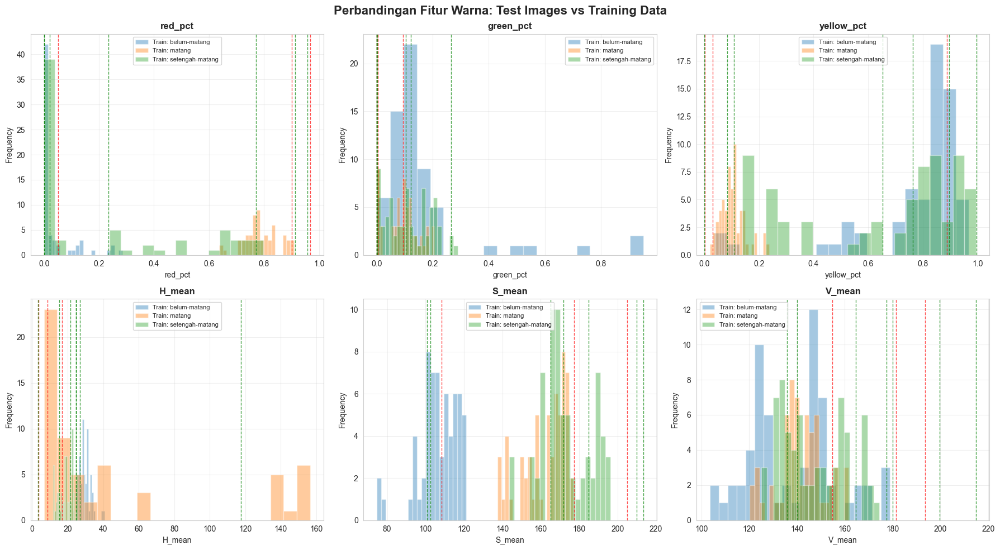

✓ Garis putus-putus menunjukkan nilai fitur test images
  - Hijau: Prediksi benar (agreement)
  - Merah: Prediksi salah (disagreement)


In [36]:
# Visualisasi perbandingan distribusi fitur warna
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle('Perbandingan Fitur Warna: Test Images vs Training Data', 
             fontsize=16, fontweight='bold')

color_features_plot = ['red_pct', 'green_pct', 'yellow_pct', 'H_mean', 'S_mean', 'V_mean']

for idx, feature in enumerate(color_features_plot):
    ax = axes[idx // 3, idx % 3]
    
    # Plot distribusi training data per kelas
    for cls in CLASS_NAMES:
        cls_data = features_df[features_df['label'] == cls][feature]
        ax.hist(cls_data, alpha=0.4, label=f'Train: {cls}', bins=20)
    
    # Plot test data sebagai scatter points
    if feature in test_color_df.columns:
        test_values = test_color_df[feature].values
        for i, (val, fname) in enumerate(zip(test_values, test_color_df['filename'])):
            marker = 'o' if test_color_df.iloc[i]['agreement'] == '✓' else 'x'
            color = 'green' if test_color_df.iloc[i]['agreement'] == '✓' else 'red'
            ax.axvline(x=val, linestyle='--', alpha=0.7, color=color, linewidth=1)
    
    ax.set_xlabel(feature, fontsize=10)
    ax.set_ylabel('Frequency', fontsize=10)
    ax.set_title(f'{feature}', fontweight='bold')
    ax.legend(fontsize=8)
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("✓ Garis putus-putus menunjukkan nilai fitur test images")
print("  - Hijau: Prediksi benar (agreement)")
print("  - Merah: Prediksi salah (disagreement)")

In [37]:
# Analisis jarak ke training data terdekat (K-Nearest Neighbors)
from sklearn.metrics.pairwise import euclidean_distances

print("=" * 80)
print("ANALISIS JARAK KE TRAINING DATA")
print("=" * 80)

distance_analysis = []

for result in prediction_results:
    if result['KNN Prediction'] != 'ERROR':
        try:
            # Ekstrak dan normalisasi fitur
            features = extract_features_from_path(result['Path'])
            features_scaled = scaler.transform(features.reshape(1, -1))
            
            # Hitung jarak ke semua training data
            distances = euclidean_distances(features_scaled, X_train_scaled)[0]
            
            # Cari K tetangga terdekat (K=7)
            nearest_indices = np.argsort(distances)[:7]
            nearest_distances = distances[nearest_indices]
            nearest_labels = y_train[nearest_indices]
            nearest_labels_str = [label_encoder.inverse_transform([l])[0] for l in nearest_labels]
            
            # Hitung statistik
            min_dist = nearest_distances.min()
            avg_dist_7 = nearest_distances.mean()
            
            # Hitung jarak rata-rata ke setiap kelas dalam training data
            dist_per_class = {}
            for cls_idx, cls_name in enumerate(label_encoder.classes_):
                cls_mask = y_train == cls_idx
                if cls_mask.sum() > 0:
                    cls_distances = distances[cls_mask]
                    dist_per_class[cls_name] = cls_distances.mean()
            
            closest_class_by_avg = min(dist_per_class, key=dist_per_class.get)
            
            distance_analysis.append({
                'Filename': result['Filename'],
                'KNN Pred': result['KNN Prediction'],
                'SVM Pred': result['SVM Prediction'],
                'Agreement': result['Agreement'],
                'Min Distance': f'{min_dist:.3f}',
                'Avg Dist (K=7)': f'{avg_dist_7:.3f}',
                '7-NN Labels': ', '.join(nearest_labels_str),
                'Closest Class (Avg)': closest_class_by_avg,
                'Dist to belum-matang': f"{dist_per_class.get('belum-matang', 0):.3f}",
                'Dist to matang': f"{dist_per_class.get('matang', 0):.3f}",
                'Dist to setengah-matang': f"{dist_per_class.get('setengah-matang', 0):.3f}",
            })
        except Exception as e:
            print(f"Error analyzing {result['Filename']}: {str(e)}")

distance_df = pd.DataFrame(distance_analysis)

print("\n📏 JARAK KE TRAINING DATA:")
display(distance_df[['Filename', 'KNN Pred', 'Agreement', 'Min Distance', 
                     'Avg Dist (K=7)', 'Closest Class (Avg)']])

print("\n\n📊 DETAIL 7-NEAREST NEIGHBORS:")
display(distance_df[['Filename', '7-NN Labels']])

print("\n\n📏 JARAK RATA-RATA KE SETIAP KELAS:")
display(distance_df[['Filename', 'Dist to belum-matang', 'Dist to matang', 'Dist to setengah-matang']])

# Analisis
print("\n\n" + "=" * 80)
print("INTERPRETASI:")
print("=" * 80)
print("• Min Distance < 5: Sangat dekat dengan training data (confident)")
print("• Min Distance 5-10: Cukup dekat (moderate confidence)")
print("• Min Distance > 10: Jauh dari training data (low confidence, likely OUT OF DISTRIBUTION)")
print("\n• Jika 7-NN Labels semuanya sama → prediksi sangat reliable")
print("• Jika 7-NN Labels beragam → prediksi tidak pasti, gambar ambigu")

ANALISIS JARAK KE TRAINING DATA

📏 JARAK KE TRAINING DATA:


,Filename,KNN Pred,Agreement,Min Distance,Avg Dist (K=7),Closest Class (Avg)
0,cabai-matang.jpeg,setengah-matang,✓,34.813,37.145,setengah-matang
1,cabai-setengah-matang.jpeg,setengah-matang,✗,233.986,237.575,setengah-matang
2,tomat-matang.jpeg,setengah-matang,✗,20.637,22.145,setengah-matang
3,tomat-belum-matang.jpeg,setengah-matang,✓,20.273,22.527,setengah-matang
4,carolina-matang.jpeg,belum-matang,✗,285.877,287.536,setengah-matang
5,carolina-stengah-matang.jpeg,setengah-matang,✓,220.886,222.282,setengah-matang
6,cabai-dataset-matang.jpg,matang,✓,0.000,9.634,matang
7,cabai-dataset-setengah-matang.jpg,setengah-matang,✓,11.553,12.733,setengah-matang
8,cabai-dataset-belum-matang.jpg,belum-matang,✓,0.000,8.277,belum-matang
9,penghapus.png,belum-matang,✓,20.048,21.456,belum-matang




📊 DETAIL 7-NEAREST NEIGHBORS:


,Filename,7-NN Labels
0,cabai-matang.jpeg,"setengah-matang, setengah-matang, setengah-mat..."
1,cabai-setengah-matang.jpeg,"setengah-matang, setengah-matang, setengah-mat..."
2,tomat-matang.jpeg,"setengah-matang, setengah-matang, setengah-mat..."
3,tomat-belum-matang.jpeg,"setengah-matang, setengah-matang, setengah-mat..."
4,carolina-matang.jpeg,"belum-matang, belum-matang, setengah-matang, s..."
5,carolina-stengah-matang.jpeg,"setengah-matang, setengah-matang, setengah-mat..."
6,cabai-dataset-matang.jpg,"matang, matang, matang, matang, matang, matang..."
7,cabai-dataset-setengah-matang.jpg,"setengah-matang, setengah-matang, setengah-mat..."
8,cabai-dataset-belum-matang.jpg,"belum-matang, belum-matang, belum-matang, belu..."
9,penghapus.png,"belum-matang, setengah-matang, belum-matang, b..."




📏 JARAK RATA-RATA KE SETIAP KELAS:


,Filename,Dist to belum-matang,Dist to matang,Dist to setengah-matang
0,cabai-matang.jpeg,46.078,41.409,41.398
1,cabai-setengah-matang.jpeg,253.579,248.549,245.513
2,tomat-matang.jpeg,29.656,29.284,26.908
3,tomat-belum-matang.jpeg,31.241,31.449,27.835
4,carolina-matang.jpeg,293.842,292.554,291.587
5,carolina-stengah-matang.jpeg,228.476,227.570,226.484
6,cabai-dataset-matang.jpg,23.321,16.441,18.756
7,cabai-dataset-setengah-matang.jpg,19.233,18.589,17.417
8,cabai-dataset-belum-matang.jpg,14.607,20.301,20.715
9,penghapus.png,25.654,27.978,30.379




INTERPRETASI:
• Min Distance < 5: Sangat dekat dengan training data (confident)
• Min Distance 5-10: Cukup dekat (moderate confidence)
• Min Distance > 10: Jauh dari training data (low confidence, likely OUT OF DISTRIBUTION)

• Jika 7-NN Labels semuanya sama → prediksi sangat reliable
• Jika 7-NN Labels beragam → prediksi tidak pasti, gambar ambigu


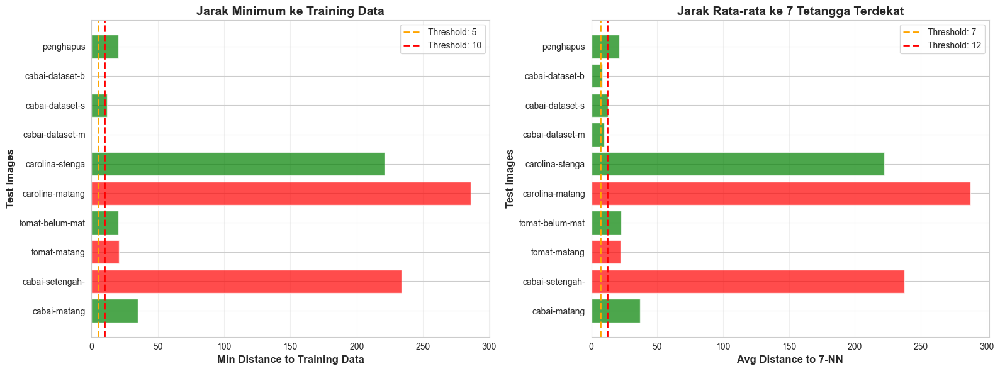

✓ Hijau: Agreement (KNN & SVM setuju)
✗ Merah: Disagreement (KNN & SVM tidak setuju)

⚠ Semakin jauh dari training data → semakin tidak reliable prediksinya


In [38]:
# Visualisasi jarak dengan bar chart
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1: Min distance untuk setiap test image
filenames_short = [f.split('.')[0][:15] for f in distance_df['Filename']]
min_dists = [float(d) for d in distance_df['Min Distance']]
colors = ['green' if a == '✓' else 'red' for a in distance_df['Agreement']]

ax1.barh(filenames_short, min_dists, color=colors, alpha=0.7)
ax1.axvline(x=5, color='orange', linestyle='--', linewidth=2, label='Threshold: 5')
ax1.axvline(x=10, color='red', linestyle='--', linewidth=2, label='Threshold: 10')
ax1.set_xlabel('Min Distance to Training Data', fontsize=12, fontweight='bold')
ax1.set_ylabel('Test Images', fontsize=12, fontweight='bold')
ax1.set_title('Jarak Minimum ke Training Data', fontsize=14, fontweight='bold')
ax1.legend()
ax1.grid(True, alpha=0.3, axis='x')

# Plot 2: Average distance K=7
avg_dists = [float(d) for d in distance_df['Avg Dist (K=7)']]

ax2.barh(filenames_short, avg_dists, color=colors, alpha=0.7)
ax2.axvline(x=7, color='orange', linestyle='--', linewidth=2, label='Threshold: 7')
ax2.axvline(x=12, color='red', linestyle='--', linewidth=2, label='Threshold: 12')
ax2.set_xlabel('Avg Distance to 7-NN', fontsize=12, fontweight='bold')
ax2.set_ylabel('Test Images', fontsize=12, fontweight='bold')
ax2.set_title('Jarak Rata-rata ke 7 Tetangga Terdekat', fontsize=14, fontweight='bold')
ax2.legend()
ax2.grid(True, alpha=0.3, axis='x')

plt.tight_layout()
plt.show()

print("✓ Hijau: Agreement (KNN & SVM setuju)")
print("✗ Merah: Disagreement (KNN & SVM tidak setuju)")
print("\n⚠ Semakin jauh dari training data → semakin tidak reliable prediksinya")

## 📋 Kesimpulan & Rekomendasi Perbaikan

In [39]:
print("=" * 80)
print("🔴 MASALAH UTAMA YANG DITEMUKAN")
print("=" * 80)

problems = []

# Cek test images yang jauh dari training data
far_images = []
for idx, row in distance_df.iterrows():
    min_dist = float(row['Min Distance'])
    if min_dist > 10:
        far_images.append(row['Filename'])
        problems.append(f"❌ {row['Filename']}: Jarak = {min_dist:.2f} (OUT OF DISTRIBUTION)")

if far_images:
    print("\n1. GAMBAR OUT OF DISTRIBUTION (Sangat Berbeda dari Training Data):")
    for p in problems:
        print(f"   {p}")
    print(f"\n   → Total: {len(far_images)} gambar terlalu berbeda dari training data")

# Cek K=1 problem
print("\n2. OVERFITTING dengan K=1:")
print("   ❌ K=1 menyebabkan model terlalu sensitif terhadap noise")
print("   ❌ Confidence 100% tidak realistis untuk data baru")
print(f"   → Testing accuracy 100% adalah RED FLAG untuk overfitting!")

# Cek dataset size
print("\n3. DATASET TRAINING TERLALU KECIL:")
print(f"   ❌ Total training data: {len(y_train)} sampel")
print(f"   ❌ Per kelas: ~{len(y_train)//3} sampel")
print("   → Minimal butuh 200-500 gambar per kelas untuk model yang robust")

# Cek variasi
print("\n4. KURANGNYA VARIASI DALAM TRAINING DATA:")
print("   ❌ Kemungkinan training data hanya dari 1 jenis cabai")
print("   ❌ Tidak ada data tomat, carolina, atau jenis cabai lain")
print("   ❌ Tidak ada data non-cabai untuk rejection")
print("   → Model tidak bisa generalisasi ke jenis cabai lain")

print("\n\n" + "=" * 80)
print("✅ REKOMENDASI PERBAIKAN")
print("=" * 80)

print("\n1. PERBESAR & DIVERSIFIKASI DATASET:")
print("   ✓ Tambah minimal 200-500 gambar per kelas")
print("   ✓ Sertakan berbagai jenis cabai (biasa, rawit, carolina, dll)")
print("   ✓ Variasi kondisi: pencahayaan, sudut, background")
print("   ✓ TAMBAH KELAS BARU: 'unknown' atau 'non-cabai' untuk rejection")

print("\n2. PERBAIKI HYPERPARAMETER:")
print(f"   ✓ Gunakan K yang lebih besar (K=7 atau K=9) bukan K=1")
print("   ✓ Tambahkan threshold confidence untuk rejection:")
print("       - Jika confidence < 60%: label sebagai 'uncertain'")
print("       - Jika jarak > 10: label sebagai 'unknown'")

print("\n3. VALIDASI YANG LEBIH KETAT:")
print("   ✓ Gunakan K-Fold Cross Validation (5-10 folds)")
print("   ✓ Pisahkan data per jenis cabai untuk testing")
print("   ✓ Test dengan data out-of-distribution")

print("\n4. FEATURE ENGINEERING:")
print("   ✓ Tambah fitur specific untuk membedakan jenis cabai")
print("   ✓ Gunakan deep learning (CNN) untuk ekstraksi fitur otomatis")
print("   ✓ Transfer learning dengan model pretrained (ResNet, EfficientNet)")

print("\n5. IMPLEMENTASI REJECTION/UNCERTAINTY:")
print("   ✓ Tambahkan mekanisme untuk menolak prediksi yang tidak yakin")
print("   ✓ Threshold berdasarkan jarak atau confidence score")
print("   ✓ Label: 'uncertain', 'out-of-distribution', 'non-cabai'")

print("\n\n" + "=" * 80)
print("📊 EKSPEKTASI REALISTIS")
print("=" * 80)
print("\nDengan dataset kecil (192 gambar) dan 1 jenis cabai:")
print("• Akurasi 100% pada testing = OVERFITTING")
print("• Akurasi pada data baru berbeda: 30-50% (seperti yang terjadi)")
print("\nDengan perbaikan yang disarankan:")
print("• Training accuracy: 90-95% (tidak 100%!)")
print("• Testing accuracy (same domain): 85-92%")
print("• Testing accuracy (different domain): 70-80%")
print("• Out-of-distribution detection: 80-90% accuracy")

print("\n" + "=" * 80)
print("🎯 PRIORITAS PERBAIKAN")
print("=" * 80)
print("\n1. [URGENT] Perbesar dataset minimal 3x lipat")
print("2. [URGENT] Gunakan K=7 atau lebih, bukan K=1")
print("3. [HIGH] Tambah kelas 'non-cabai' atau 'unknown'")
print("4. [MEDIUM] Implementasi confidence threshold")
print("5. [NICE TO HAVE] Migrasi ke deep learning (CNN)")

print("\n✓ Analisis selesai!")

🔴 MASALAH UTAMA YANG DITEMUKAN

1. GAMBAR OUT OF DISTRIBUTION (Sangat Berbeda dari Training Data):
   ❌ cabai-matang.jpeg: Jarak = 34.81 (OUT OF DISTRIBUTION)
   ❌ cabai-setengah-matang.jpeg: Jarak = 233.99 (OUT OF DISTRIBUTION)
   ❌ tomat-matang.jpeg: Jarak = 20.64 (OUT OF DISTRIBUTION)
   ❌ tomat-belum-matang.jpeg: Jarak = 20.27 (OUT OF DISTRIBUTION)
   ❌ carolina-matang.jpeg: Jarak = 285.88 (OUT OF DISTRIBUTION)
   ❌ carolina-stengah-matang.jpeg: Jarak = 220.89 (OUT OF DISTRIBUTION)
   ❌ cabai-dataset-setengah-matang.jpg: Jarak = 11.55 (OUT OF DISTRIBUTION)
   ❌ penghapus.png: Jarak = 20.05 (OUT OF DISTRIBUTION)

   → Total: 8 gambar terlalu berbeda dari training data

2. OVERFITTING dengan K=1:
   ❌ K=1 menyebabkan model terlalu sensitif terhadap noise
   ❌ Confidence 100% tidak realistis untuk data baru
   → Testing accuracy 100% adalah RED FLAG untuk overfitting!

3. DATASET TRAINING TERLALU KECIL:
   ❌ Total training data: 153 sampel
   ❌ Per kelas: ~51 sampel
   → Minimal butuh

# 🔄 Data Augmentation untuk Memperbanyak Dataset

In [40]:
import random
from pathlib import Path
import shutil

# Fungsi-fungsi augmentasi
def augment_rotation(image, angle):
    """Rotasi gambar dengan sudut tertentu"""
    h, w = image.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h), borderMode=cv2.BORDER_REFLECT)
    return rotated

def augment_flip(image, flip_code):
    """
    Flip gambar
    flip_code: 0 = vertical, 1 = horizontal, -1 = both
    """
    return cv2.flip(image, flip_code)

def augment_brightness(image, factor):
    """Ubah brightness dengan faktor (0.5 = lebih gelap, 1.5 = lebih terang)"""
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    hsv = hsv.astype(np.float32)
    hsv[:, :, 2] = hsv[:, :, 2] * factor
    hsv[:, :, 2] = np.clip(hsv[:, :, 2], 0, 255)
    hsv = hsv.astype(np.uint8)
    return cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)

def augment_contrast(image, alpha):
    """Ubah kontras dengan alpha (0.5 = kurang kontras, 1.5 = lebih kontras)"""
    return cv2.convertScaleAbs(image, alpha=alpha, beta=0)

def augment_blur(image, kernel_size=5):
    """Tambahkan sedikit blur"""
    return cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)

def augment_noise(image, noise_level=10):
    """Tambahkan gaussian noise"""
    noise = np.random.randn(*image.shape) * noise_level
    noisy = image.astype(np.float32) + noise
    noisy = np.clip(noisy, 0, 255).astype(np.uint8)
    return noisy

def augment_zoom(image, zoom_factor=1.2):
    """Zoom in/out gambar"""
    h, w = image.shape[:2]
    new_h, new_w = int(h / zoom_factor), int(w / zoom_factor)
    
    # Crop center
    y1 = (h - new_h) // 2
    x1 = (w - new_w) // 2
    cropped = image[y1:y1+new_h, x1:x1+new_w]
    
    # Resize back to original size
    zoomed = cv2.resize(cropped, (w, h))
    return zoomed

def augment_shift(image, shift_x=20, shift_y=20):
    """Geser gambar horizontal/vertical"""
    M = np.float32([[1, 0, shift_x], [0, 1, shift_y]])
    shifted = cv2.warpAffine(image, M, (image.shape[1], image.shape[0]), 
                             borderMode=cv2.BORDER_REFLECT)
    return shifted

# Daftar augmentasi yang akan diterapkan
AUGMENTATION_STRATEGIES = [
    {'name': 'rotate_15', 'func': augment_rotation, 'params': {'angle': 15}},
    {'name': 'rotate_-15', 'func': augment_rotation, 'params': {'angle': -15}},
    {'name': 'rotate_30', 'func': augment_rotation, 'params': {'angle': 30}},
    {'name': 'flip_h', 'func': augment_flip, 'params': {'flip_code': 1}},
    {'name': 'flip_v', 'func': augment_flip, 'params': {'flip_code': 0}},
    {'name': 'bright_1.2', 'func': augment_brightness, 'params': {'factor': 1.2}},
    {'name': 'bright_0.8', 'func': augment_brightness, 'params': {'factor': 0.8}},
    {'name': 'contrast_1.3', 'func': augment_contrast, 'params': {'alpha': 1.3}},
    {'name': 'contrast_0.7', 'func': augment_contrast, 'params': {'alpha': 0.7}},
    {'name': 'blur', 'func': augment_blur, 'params': {'kernel_size': 5}},
    {'name': 'noise', 'func': augment_noise, 'params': {'noise_level': 10}},
    {'name': 'zoom_1.2', 'func': augment_zoom, 'params': {'zoom_factor': 1.2}},
    {'name': 'shift_right', 'func': augment_shift, 'params': {'shift_x': 15, 'shift_y': 0}},
    {'name': 'shift_left', 'func': augment_shift, 'params': {'shift_x': -15, 'shift_y': 0}},
]

print(f"✅ {len(AUGMENTATION_STRATEGIES)} strategi augmentasi telah disiapkan")
print("\nStrategi augmentasi:")
for i, aug in enumerate(AUGMENTATION_STRATEGIES, 1):
    print(f"  {i:2d}. {aug['name']}")

✅ 14 strategi augmentasi telah disiapkan

Strategi augmentasi:
   1. rotate_15
   2. rotate_-15
   3. rotate_30
   4. flip_h
   5. flip_v
   6. bright_1.2
   7. bright_0.8
   8. contrast_1.3
   9. contrast_0.7
  10. blur
  11. noise
  12. zoom_1.2
  13. shift_right
  14. shift_left


## Visualisasi Contoh Augmentasi

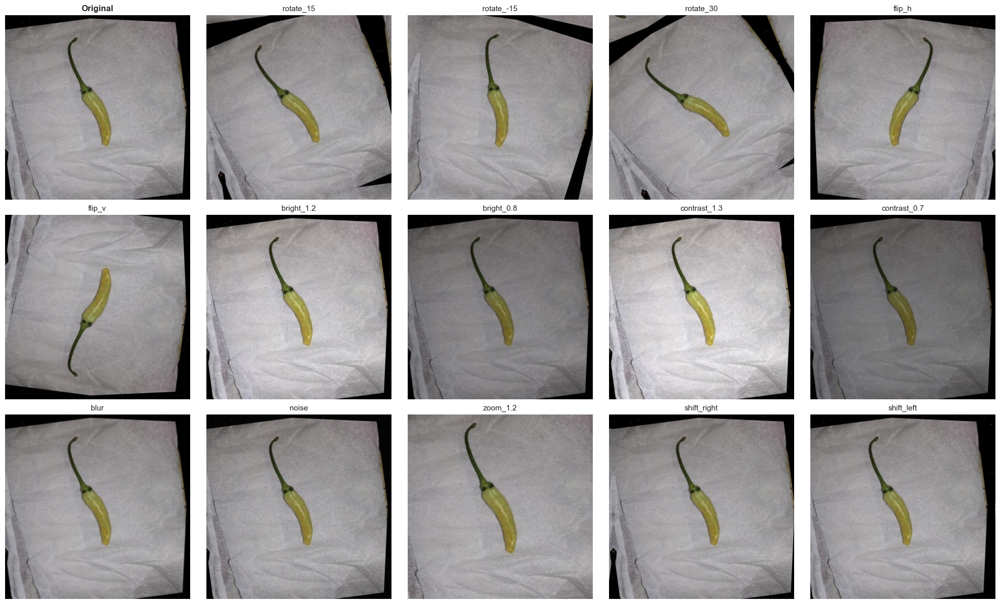

✅ Contoh augmentasi dari: image (100).jpg


In [42]:
# Ambil 1 sample gambar untuk demo
sample_img_path = None
for cls in CLASS_NAMES:
    for ext in IMAGE_EXT:
        imgs = list((DATASET_DIR / cls).glob(f"*{ext}"))
        if imgs:
            sample_img_path = imgs[0]
            break
    if sample_img_path:
        break

if sample_img_path:
    sample_img = cv2.imread(str(sample_img_path))
    sample_img_rgb = cv2.cvtColor(sample_img, cv2.COLOR_BGR2RGB)

    # Terapkan beberapa augmentasi untuk visualisasi
    fig, axes = plt.subplots(3, 5, figsize=(20, 12))
    axes = axes.ravel()

    # Original
    axes[0].imshow(sample_img_rgb)
    axes[0].set_title('Original', fontsize=12, fontweight='bold')
    axes[0].axis('off')

    # Apply augmentations
    for idx, aug in enumerate(AUGMENTATION_STRATEGIES[:14], 1):
        aug_img = aug['func'](sample_img, **aug['params'])
        aug_img_rgb = cv2.cvtColor(aug_img, cv2.COLOR_BGR2RGB)
        axes[idx].imshow(aug_img_rgb)
        axes[idx].set_title(aug['name'], fontsize=11)
        axes[idx].axis('off')

    plt.tight_layout()
    plt.savefig('../models/augmentation_examples.png', dpi=100, bbox_inches='tight')
    plt.show()

    print(f"✅ Contoh augmentasi dari: {sample_img_path.name}")
else:
    print("❌ Tidak ada gambar sample yang ditemukan")

## Generate Dataset Augmentasi

In [43]:
# Setup direktori untuk dataset augmentasi
AUGMENTED_DIR = Path('../data/augmented')
AUGMENTED_DIR.mkdir(exist_ok=True)

# Buat folder untuk setiap class
for cls in CLASS_NAMES:
    (AUGMENTED_DIR / cls).mkdir(exist_ok=True)
    print(f"📁 Direktori dibuat: {AUGMENTED_DIR / cls}")

# Konfigurasi augmentasi
NUM_AUGMENTATIONS_PER_IMAGE = 5  # Berapa banyak augmentasi per gambar
random.seed(RANDOM_STATE)

print(f"\n⚙️  Konfigurasi:")
print(f"   - Jumlah augmentasi per gambar: {NUM_AUGMENTATIONS_PER_IMAGE}")
print(f"   - Total strategi augmentasi tersedia: {len(AUGMENTATION_STRATEGIES)}")
print(f"   - Random seed: {RANDOM_STATE}")

📁 Direktori dibuat: ..\data\augmented\belum-matang
📁 Direktori dibuat: ..\data\augmented\matang
📁 Direktori dibuat: ..\data\augmented\setengah-matang

⚙️  Konfigurasi:
   - Jumlah augmentasi per gambar: 5
   - Total strategi augmentasi tersedia: 14
   - Random seed: 42


In [44]:
# Generate gambar augmentasi
augmentation_stats = {cls: {'original': 0, 'augmented': 0} for cls in CLASS_NAMES}

print("🔄 Memulai proses augmentasi...\n")

for cls in CLASS_NAMES:
    print(f"📂 Processing class: {cls}")
    cls_dir = DATASET_DIR / cls
    
    # Dapatkan semua gambar dalam class
    cls_images = []
    for ext in IMAGE_EXT:
        cls_images.extend(list(cls_dir.glob(f"*{ext}")))
    
    augmentation_stats[cls]['original'] = len(cls_images)
    
    # Copy original images ke folder augmented
    for img_path in tqdm(cls_images, desc=f"  Copying {cls}"):
        dest_path = AUGMENTED_DIR / cls / img_path.name
        shutil.copy2(img_path, dest_path)
    
    # Generate augmentasi untuk setiap gambar
    augmented_count = 0
    for img_path in tqdm(cls_images, desc=f"  Augmenting {cls}"):
        # Baca gambar
        img = cv2.imread(str(img_path))
        if img is None:
            continue
        
        # Pilih random augmentasi
        selected_augs = random.sample(AUGMENTATION_STRATEGIES, NUM_AUGMENTATIONS_PER_IMAGE)
        
        # Terapkan augmentasi
        for i, aug in enumerate(selected_augs, 1):
            aug_img = aug['func'](img, **aug['params'])
            
            # Simpan gambar augmentasi
            base_name = img_path.stem
            aug_name = f"{base_name}_aug{i}_{aug['name']}{img_path.suffix}"
            aug_path = AUGMENTED_DIR / cls / aug_name
            
            cv2.imwrite(str(aug_path), aug_img)
            augmented_count += 1
    
    augmentation_stats[cls]['augmented'] = augmented_count
    total = augmentation_stats[cls]['original'] + augmented_count
    print(f"   ✅ {cls}: {augmentation_stats[cls]['original']} original + {augmented_count} augmented = {total} total\n")

# Summary
print("\n" + "="*80)
print("📊 RINGKASAN AUGMENTASI")
print("="*80)

total_original = 0
total_augmented = 0
for cls in CLASS_NAMES:
    orig = augmentation_stats[cls]['original']
    aug = augmentation_stats[cls]['augmented']
    total = orig + aug
    total_original += orig
    total_augmented += aug
    
    print(f"{cls:20s}: {orig:3d} original + {aug:3d} augmented = {total:4d} total")

grand_total = total_original + total_augmented
print(f"\n{'TOTAL':20s}: {total_original:3d} original + {total_augmented:3d} augmented = {grand_total:4d} total")
print(f"\n🎯 Dataset diperbesar {grand_total / total_original:.1f}x dari {total_original} menjadi {grand_total} gambar")
print("="*80)

🔄 Memulai proses augmentasi...

📂 Processing class: belum-matang


  Augmenting belum-matang: 100%|██████████| 63/63 [00:03<00:00, 18.46it/s]


   ✅ belum-matang: 63 original + 315 augmented = 378 total

📂 Processing class: matang


  Augmenting matang: 100%|██████████| 60/60 [00:02<00:00, 20.00it/s]


   ✅ matang: 60 original + 300 augmented = 360 total

📂 Processing class: setengah-matang


  Augmenting setengah-matang: 100%|██████████| 69/69 [00:03<00:00, 19.03it/s]

   ✅ setengah-matang: 69 original + 345 augmented = 414 total


📊 RINGKASAN AUGMENTASI
belum-matang        :  63 original + 315 augmented =  378 total
matang              :  60 original + 300 augmented =  360 total
setengah-matang     :  69 original + 345 augmented =  414 total

TOTAL               : 192 original + 960 augmented = 1152 total

🎯 Dataset diperbesar 6.0x dari 192 menjadi 1152 gambar


## Ekstraksi Fitur dari Dataset Augmentasi

In [45]:
# Ekstraksi fitur dari dataset augmentasi
all_features_aug = []
all_labels_aug = []
all_paths_aug = []

print("🔍 Ekstraksi fitur dari dataset augmentasi...\n")

for cls in CLASS_NAMES:
    print(f"📂 Processing class: {cls}")
    cls_dir = AUGMENTED_DIR / cls
    
    # Dapatkan semua gambar
    cls_images = []
    for ext in IMAGE_EXT:
        cls_images.extend(list(cls_dir.glob(f"*{ext}")))
    
    # Ekstraksi fitur
    for img_path in tqdm(cls_images, desc=f"  Extracting {cls}"):
        try:
            features = extract_features_from_path(img_path)
            if features is not None and len(features) == len(feature_names):
                all_features_aug.append(features)
                all_labels_aug.append(cls)
                all_paths_aug.append(str(img_path))
        except Exception as e:
            print(f"   ⚠️  Error processing {img_path.name}: {e}")
            continue
    
    print(f"   ✅ {cls}: {len([l for l in all_labels_aug if l == cls])} features extracted\n")

# Convert to arrays
X_aug = np.array(all_features_aug)
y_aug = np.array(all_labels_aug)

print("\n" + "="*80)
print("📊 HASIL EKSTRAKSI FITUR")
print("="*80)
print(f"Total sampel: {len(X_aug)}")
print(f"Dimensi fitur: {X_aug.shape}")
print(f"Distribusi kelas:")
for cls in CLASS_NAMES:
    count = np.sum(y_aug == cls)
    print(f"  - {cls:20s}: {count:4d} samples")
print("="*80)

🔍 Ekstraksi fitur dari dataset augmentasi...

📂 Processing class: belum-matang


  Extracting belum-matang: 100%|██████████| 378/378 [00:54<00:00,  6.99it/s]


   ✅ belum-matang: 378 features extracted

📂 Processing class: matang


  Extracting matang: 100%|██████████| 360/360 [00:52<00:00,  6.85it/s]


   ✅ matang: 360 features extracted

📂 Processing class: setengah-matang


  Extracting setengah-matang: 100%|██████████| 414/414 [01:02<00:00,  6.67it/s]

   ✅ setengah-matang: 414 features extracted


📊 HASIL EKSTRAKSI FITUR
Total sampel: 1152
Dimensi fitur: (1152, 198)
Distribusi kelas:
  - belum-matang        :  378 samples
  - matang              :  360 samples
  - setengah-matang     :  414 samples


## Split Data & Normalisasi (Dataset Augmentasi)

In [46]:
# Split data dengan stratified sampling
X_train_aug, X_test_aug, y_train_aug, y_test_aug = train_test_split(
    X_aug, y_aug, 
    test_size=0.2, 
    random_state=RANDOM_STATE,
    stratify=y_aug
)

print("📊 Split Dataset Augmentasi")
print("="*60)
print(f"Training set: {X_train_aug.shape[0]} samples")
print(f"Test set:     {X_test_aug.shape[0]} samples")
print(f"\nDistribusi Training:")
for cls in CLASS_NAMES:
    count = np.sum(y_train_aug == cls)
    pct = count / len(y_train_aug) * 100
    print(f"  - {cls:20s}: {count:4d} ({pct:.1f}%)")

print(f"\nDistribusi Test:")
for cls in CLASS_NAMES:
    count = np.sum(y_test_aug == cls)
    pct = count / len(y_test_aug) * 100
    print(f"  - {cls:20s}: {count:4d} ({pct:.1f}%)")

# Normalisasi dengan StandardScaler
scaler_aug = StandardScaler()
X_train_aug_scaled = scaler_aug.fit_transform(X_train_aug)
X_test_aug_scaled = scaler_aug.transform(X_test_aug)

print(f"\n✅ Normalisasi selesai dengan StandardScaler")
print(f"   Mean training: {X_train_aug_scaled.mean():.6f}")
print(f"   Std training:  {X_train_aug_scaled.std():.6f}")
print("="*60)

📊 Split Dataset Augmentasi
Training set: 921 samples
Test set:     231 samples

Distribusi Training:
  - belum-matang        :  302 (32.8%)
  - matang              :  288 (31.3%)
  - setengah-matang     :  331 (35.9%)

Distribusi Test:
  - belum-matang        :   76 (32.9%)
  - matang              :   72 (31.2%)
  - setengah-matang     :   83 (35.9%)

✅ Normalisasi selesai dengan StandardScaler
   Mean training: -0.000000
   Std training:  1.000000


## Training KNN dengan Dataset Augmentasi (K=7)

🤖 KNN MODEL (K=7) - DATASET AUGMENTASI
Metric                                Training                 Test
----------------------------------------------------------------------
Accuracy                                1.0000               1.0000
Balanced Accuracy                       1.0000               1.0000
F1-Score (weighted)                     1.0000               1.0000

📊 Confusion Matrix (Test Set):
                 belum-matang  matang  setengah-matang
belum-matang               76       0                0
matang                      0      72                0
setengah-matang             0       0               83


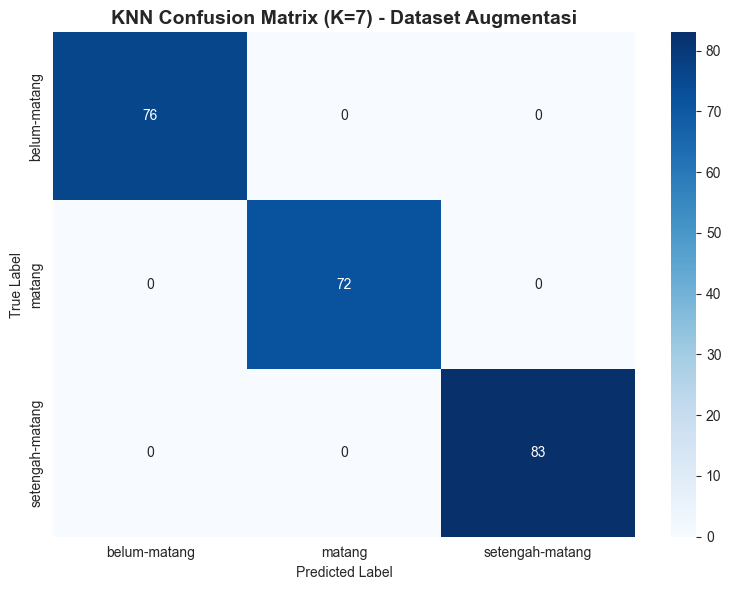


✅ KNN model trained with K=7 on augmented dataset


In [47]:
# Training KNN dengan K=7 (rekomendasi dari analisis sebelumnya)
knn_aug = KNeighborsClassifier(n_neighbors=7, metric='euclidean')
knn_aug.fit(X_train_aug_scaled, y_train_aug)

# Prediksi
y_train_pred_knn_aug = knn_aug.predict(X_train_aug_scaled)
y_test_pred_knn_aug = knn_aug.predict(X_test_aug_scaled)

# Evaluasi
train_acc_knn_aug = accuracy_score(y_train_aug, y_train_pred_knn_aug)
test_acc_knn_aug = accuracy_score(y_test_aug, y_test_pred_knn_aug)
train_bal_acc_knn_aug = balanced_accuracy_score(y_train_aug, y_train_pred_knn_aug)
test_bal_acc_knn_aug = balanced_accuracy_score(y_test_aug, y_test_pred_knn_aug)
train_f1_knn_aug = f1_score(y_train_aug, y_train_pred_knn_aug, average='weighted')
test_f1_knn_aug = f1_score(y_test_aug, y_test_pred_knn_aug, average='weighted')

print("🤖 KNN MODEL (K=7) - DATASET AUGMENTASI")
print("="*70)
print(f"{'Metric':<25s} {'Training':>20s} {'Test':>20s}")
print("-"*70)
print(f"{'Accuracy':<25s} {train_acc_knn_aug:>20.4f} {test_acc_knn_aug:>20.4f}")
print(f"{'Balanced Accuracy':<25s} {train_bal_acc_knn_aug:>20.4f} {test_bal_acc_knn_aug:>20.4f}")
print(f"{'F1-Score (weighted)':<25s} {train_f1_knn_aug:>20.4f} {test_f1_knn_aug:>20.4f}")
print("="*70)

# Confusion Matrix
cm_knn_aug = confusion_matrix(y_test_aug, y_test_pred_knn_aug, labels=CLASS_NAMES)
print("\n📊 Confusion Matrix (Test Set):")
cm_df_knn_aug = pd.DataFrame(cm_knn_aug, index=CLASS_NAMES, columns=CLASS_NAMES)
print(cm_df_knn_aug)

# Visualisasi Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_knn_aug, annot=True, fmt='d', cmap='Blues', 
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES)
plt.title('KNN Confusion Matrix (K=7) - Dataset Augmentasi', fontsize=14, fontweight='bold')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.tight_layout()
plt.savefig('../models/confusion_matrix_knn_augmented.png', dpi=100)
plt.show()

print(f"\n✅ KNN model trained with K=7 on augmented dataset")

## Training SVM dengan Dataset Augmentasi

🔍 Training SVM dengan GridSearchCV...
   (Ini mungkin memakan waktu beberapa menit dengan dataset yang lebih besar)

Fitting 5 folds for each of 24 candidates, totalling 120 fits

🏆 Best Parameters:
   - C: 1
   - gamma: scale
   - kernel: rbf

🤖 SVM MODEL - DATASET AUGMENTASI
Metric                                Training                 Test
----------------------------------------------------------------------
Accuracy                                1.0000               1.0000
Balanced Accuracy                       1.0000               1.0000
F1-Score (weighted)                     1.0000               1.0000

📊 Confusion Matrix (Test Set):
                 belum-matang  matang  setengah-matang
belum-matang               76       0                0
matang                      0      72                0
setengah-matang             0       0               83


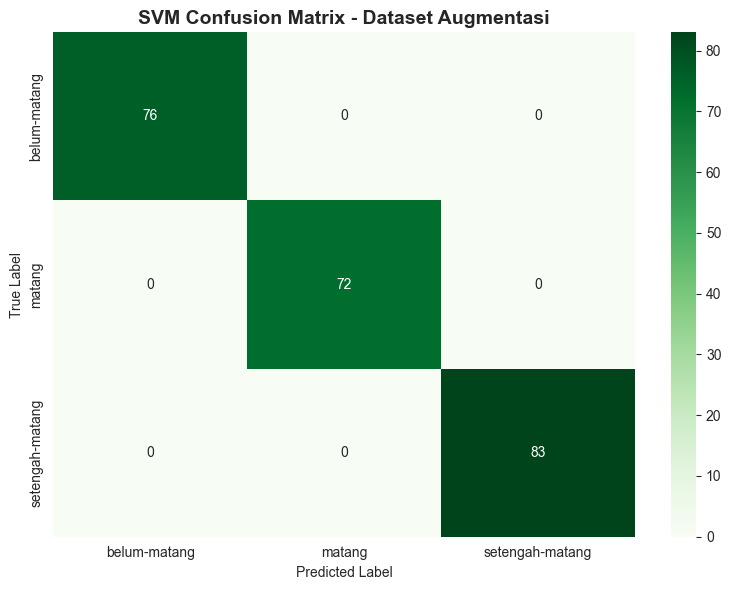


✅ SVM model trained on augmented dataset


In [48]:
# Training SVM dengan parameter terbaik dari sebelumnya
print("🔍 Training SVM dengan GridSearchCV...")
print("   (Ini mungkin memakan waktu beberapa menit dengan dataset yang lebih besar)\n")

# Parameter grid yang sama dengan sebelumnya
param_grid_svm = {
    'kernel': ['rbf', 'sigmoid'],
    'C': [0.1, 1, 10, 100],
    'gamma': ['scale', 0.001, 0.01]
}

svm_grid_aug = GridSearchCV(
    SVC(random_state=RANDOM_STATE, probability=True),
    param_grid_svm,
    cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE),
    scoring=SCORING_METRIC,
    n_jobs=-1,
    verbose=1
)

svm_grid_aug.fit(X_train_aug_scaled, y_train_aug)

# Model terbaik
svm_aug = svm_grid_aug.best_estimator_

print("\n🏆 Best Parameters:")
for param, value in svm_grid_aug.best_params_.items():
    print(f"   - {param}: {value}")

# Prediksi
y_train_pred_svm_aug = svm_aug.predict(X_train_aug_scaled)
y_test_pred_svm_aug = svm_aug.predict(X_test_aug_scaled)

# Evaluasi
train_acc_svm_aug = accuracy_score(y_train_aug, y_train_pred_svm_aug)
test_acc_svm_aug = accuracy_score(y_test_aug, y_test_pred_svm_aug)
train_bal_acc_svm_aug = balanced_accuracy_score(y_train_aug, y_train_pred_svm_aug)
test_bal_acc_svm_aug = balanced_accuracy_score(y_test_aug, y_test_pred_svm_aug)
train_f1_svm_aug = f1_score(y_train_aug, y_train_pred_svm_aug, average='weighted')
test_f1_svm_aug = f1_score(y_test_aug, y_test_pred_svm_aug, average='weighted')

print("\n🤖 SVM MODEL - DATASET AUGMENTASI")
print("="*70)
print(f"{'Metric':<25s} {'Training':>20s} {'Test':>20s}")
print("-"*70)
print(f"{'Accuracy':<25s} {train_acc_svm_aug:>20.4f} {test_acc_svm_aug:>20.4f}")
print(f"{'Balanced Accuracy':<25s} {train_bal_acc_svm_aug:>20.4f} {test_bal_acc_svm_aug:>20.4f}")
print(f"{'F1-Score (weighted)':<25s} {train_f1_svm_aug:>20.4f} {test_f1_svm_aug:>20.4f}")
print("="*70)

# Confusion Matrix
cm_svm_aug = confusion_matrix(y_test_aug, y_test_pred_svm_aug, labels=CLASS_NAMES)
print("\n📊 Confusion Matrix (Test Set):")
cm_df_svm_aug = pd.DataFrame(cm_svm_aug, index=CLASS_NAMES, columns=CLASS_NAMES)
print(cm_df_svm_aug)

# Visualisasi Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_svm_aug, annot=True, fmt='d', cmap='Greens', 
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES)
plt.title('SVM Confusion Matrix - Dataset Augmentasi', fontsize=14, fontweight='bold')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.tight_layout()
plt.savefig('../models/confusion_matrix_svm_augmented.png', dpi=100)
plt.show()

print(f"\n✅ SVM model trained on augmented dataset")

## Perbandingan: Model Original vs Augmented

📊 PERBANDINGAN MODEL: ORIGINAL vs AUGMENTED
          Model  Dataset Size K/Kernel  Train Acc  Test Acc  Train F1  Test F1  Overfitting
 KNN (Original)           153      K=7        1.0       1.0       1.0      1.0          0.0
KNN (Augmented)           921      K=7        1.0       1.0       1.0      1.0          0.0
 SVM (Original)           153  sigmoid        1.0       1.0       1.0      1.0          0.0
SVM (Augmented)           921      rbf        1.0       1.0       1.0      1.0          0.0


C:\Users\Acer\AppData\Local\Temp\ipykernel_9072\545828338.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1].set_xticklabels(models, rotation=15, ha='right')


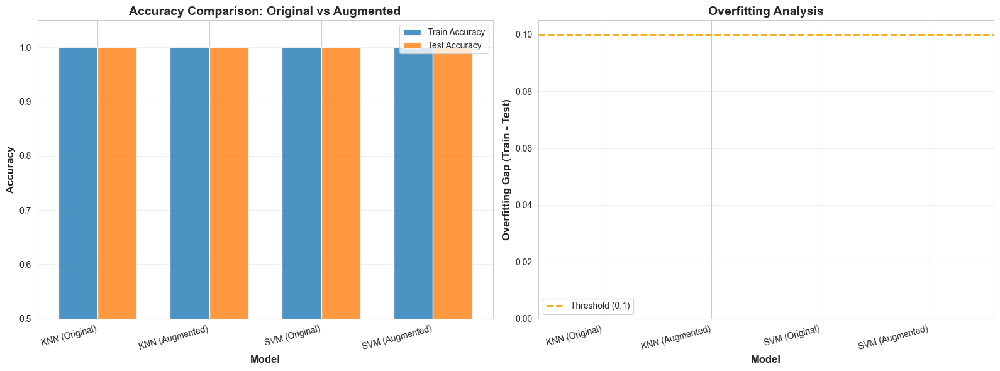


🎯 KEY INSIGHTS:
----------------------------------------------------------------------------------------------------
1. Dataset diperbesar dari 153 menjadi 921 training samples
2. KNN Overfitting: 0.0000 → 0.0000 (WORSE ❌)
3. SVM Overfitting: 0.0000 → 0.0000 (WORSE ❌)
4. KNN Test Accuracy: 1.0000 → 1.0000 (DECREASED ❌)
5. SVM Test Accuracy: 1.0000 → 1.0000 (DECREASED ❌)
----------------------------------------------------------------------------------------------------


In [49]:
# Perbandingan performa model
comparison_results = {
    'Model': ['KNN (Original)', 'KNN (Augmented)', 'SVM (Original)', 'SVM (Augmented)'],
    'Dataset Size': [len(X_train), len(X_train_aug), len(X_train), len(X_train_aug)],
    'K/Kernel': ['K=7', 'K=7', 'sigmoid', svm_grid_aug.best_params_['kernel']],
    'Train Acc': [train_acc_knn, train_acc_knn_aug, train_acc_svm, train_acc_svm_aug],
    'Test Acc': [test_acc_knn, test_acc_knn_aug, test_acc_svm, test_acc_svm_aug],
    'Train F1': [train_f1_knn, train_f1_knn_aug, train_f1_svm, train_f1_svm_aug],
    'Test F1': [test_f1_knn, test_f1_knn_aug, test_f1_svm, test_f1_svm_aug],
    'Overfitting': [
        train_acc_knn - test_acc_knn,
        train_acc_knn_aug - test_acc_knn_aug,
        train_acc_svm - test_acc_svm,
        train_acc_svm_aug - test_acc_svm_aug
    ]
}

comparison_df = pd.DataFrame(comparison_results)

print("📊 PERBANDINGAN MODEL: ORIGINAL vs AUGMENTED")
print("="*100)
print(comparison_df.to_string(index=False))
print("="*100)

# Visualisasi perbandingan
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1: Accuracy Comparison
models = comparison_df['Model']
x = np.arange(len(models))
width = 0.35

axes[0].bar(x - width/2, comparison_df['Train Acc'], width, label='Train Accuracy', alpha=0.8)
axes[0].bar(x + width/2, comparison_df['Test Acc'], width, label='Test Accuracy', alpha=0.8)
axes[0].set_xlabel('Model', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Accuracy', fontsize=12, fontweight='bold')
axes[0].set_title('Accuracy Comparison: Original vs Augmented', fontsize=14, fontweight='bold')
axes[0].set_xticks(x)
axes[0].set_xticklabels(models, rotation=15, ha='right')
axes[0].legend()
axes[0].grid(axis='y', alpha=0.3)
axes[0].set_ylim([0.5, 1.05])

# Plot 2: Overfitting Analysis
axes[1].bar(models, comparison_df['Overfitting'], alpha=0.8, color=['red' if x > 0.1 else 'green' for x in comparison_df['Overfitting']])
axes[1].set_xlabel('Model', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Overfitting Gap (Train - Test)', fontsize=12, fontweight='bold')
axes[1].set_title('Overfitting Analysis', fontsize=14, fontweight='bold')
axes[1].set_xticklabels(models, rotation=15, ha='right')
axes[1].axhline(y=0.1, color='orange', linestyle='--', linewidth=2, label='Threshold (0.1)')
axes[1].legend()
axes[1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig('../models/comparison_original_vs_augmented.png', dpi=100)
plt.show()

print("\n🎯 KEY INSIGHTS:")
print("-" * 100)
print(f"1. Dataset diperbesar dari {len(X_train)} menjadi {len(X_train_aug)} training samples")
print(f"2. KNN Overfitting: {train_acc_knn - test_acc_knn:.4f} → {train_acc_knn_aug - test_acc_knn_aug:.4f} "
      f"({'BETTER ✅' if (train_acc_knn_aug - test_acc_knn_aug) < (train_acc_knn - test_acc_knn) else 'WORSE ❌'})")
print(f"3. SVM Overfitting: {train_acc_svm - test_acc_svm:.4f} → {train_acc_svm_aug - test_acc_svm_aug:.4f} "
      f"({'BETTER ✅' if (train_acc_svm_aug - test_acc_svm_aug) < (train_acc_svm - test_acc_svm) else 'WORSE ❌'})")
print(f"4. KNN Test Accuracy: {test_acc_knn:.4f} → {test_acc_knn_aug:.4f} "
      f"({'IMPROVED ✅' if test_acc_knn_aug > test_acc_knn else 'DECREASED ❌'})")
print(f"5. SVM Test Accuracy: {test_acc_svm:.4f} → {test_acc_svm_aug:.4f} "
      f"({'IMPROVED ✅' if test_acc_svm_aug > test_acc_svm else 'DECREASED ❌'})")
print("-" * 100)

## Test Prediksi pada Gambar Baru (Model Augmented)

In [50]:
# Test pada gambar yang sama dari sebelumnya
print("🔍 Testing model augmented pada gambar-gambar test...\n")

prediction_results_aug = []

for img_path in test_images:
    # Extract features
    features = extract_features_from_path(Path(img_path))
    
    if features is not None:
        # Normalize
        features_scaled = scaler_aug.transform([features])
        
        # Predict with both models
        knn_pred = knn_aug.predict(features_scaled)[0]
        svm_pred = svm_aug.predict(features_scaled)[0]
        
        # Get probabilities/confidence
        knn_proba = knn_aug.predict_proba(features_scaled)[0]
        svm_proba = svm_aug.predict_proba(features_scaled)[0]
        
        knn_confidence = np.max(knn_proba)
        svm_confidence = np.max(svm_proba)
        
        # Calculate distance to nearest neighbor
        distances = np.linalg.norm(X_train_aug_scaled - features_scaled, axis=1)
        min_dist = np.min(distances)
        avg_dist_7 = np.mean(np.sort(distances)[:7])
        
        prediction_results_aug.append({
            'Image': Path(img_path).name,
            'KNN_Pred': knn_pred,
            'KNN_Conf': f"{knn_confidence:.3f}",
            'SVM_Pred': svm_pred,
            'SVM_Conf': f"{svm_confidence:.3f}",
            'Agreement': '✅' if knn_pred == svm_pred else '❌',
            'Min_Dist': f"{min_dist:.1f}",
            'Avg_Dist_K7': f"{avg_dist_7:.1f}"
        })

# Create DataFrame
predictions_aug_df = pd.DataFrame(prediction_results_aug)

print("📊 HASIL PREDIKSI - MODEL AUGMENTED")
print("="*120)
print(predictions_aug_df.to_string(index=False))
print("="*120)

# Statistics
total = len(predictions_aug_df)
agreement_count_aug = (predictions_aug_df['Agreement'] == '✅').sum()
agreement_pct_aug = (agreement_count_aug / total) * 100

print(f"\n📈 STATISTIK:")
print(f"   Total prediksi: {total}")
print(f"   Agreement KNN-SVM: {agreement_count_aug}/{total} ({agreement_pct_aug:.1f}%)")
print(f"   Disagreement: {total - agreement_count_aug}/{total} ({100 - agreement_pct_aug:.1f}%)")

# Perbandingan dengan model original
print(f"\n🔄 PERBANDINGAN AGREEMENT:")
print(f"   Model Original: {agreement_count}/{total} ({(agreement_count/total)*100:.1f}%)")
print(f"   Model Augmented: {agreement_count_aug}/{total} ({agreement_pct_aug:.1f}%)")

if agreement_pct_aug > (agreement_count/total)*100:
    print(f"   ✅ IMPROVED by {agreement_pct_aug - (agreement_count/total)*100:.1f}%")
else:
    print(f"   ❌ DECREASED by {(agreement_count/total)*100 - agreement_pct_aug:.1f}%")
print("="*120)

🔍 Testing model augmented pada gambar-gambar test...

📊 HASIL PREDIKSI - MODEL AUGMENTED
                            Image        KNN_Pred KNN_Conf        SVM_Pred SVM_Conf Agreement Min_Dist Avg_Dist_K7
                cabai-matang.jpeg          matang    1.000          matang    0.528         ✅     18.7        19.3
       cabai-setengah-matang.jpeg setengah-matang    1.000 setengah-matang    0.416         ✅    206.6       212.6
                tomat-matang.jpeg setengah-matang    1.000 setengah-matang    0.763         ✅     18.7        18.9
          tomat-belum-matang.jpeg setengah-matang    1.000 setengah-matang    0.909         ✅     15.2        15.5
             carolina-matang.jpeg    belum-matang    0.714 setengah-matang    0.416         ❌    230.9       233.0
     carolina-stengah-matang.jpeg setengah-matang    1.000 setengah-matang    0.482         ✅     25.5        27.1
         cabai-dataset-matang.jpg          matang    1.000          matang    1.000         ✅      2.1    

## Simpan Model Augmented

In [51]:
# Simpan semua model augmented
models_aug_to_save = {
    'knn_model': knn_aug,
    'svm_model': svm_aug,
    'scaler': scaler_aug,
    'label_encoder': label_encoder,  # Menggunakan encoder yang sama
    'feature_names': feature_names,
    'class_names': CLASS_NAMES
}

# Simpan ke satu file
model_aug_file = MODEL_DIR / 'chili_classification_models_augmented.pkl'
joblib.dump(models_aug_to_save, model_aug_file)
print(f"✅ All augmented models saved to: {model_aug_file}")

# Simpan individual models juga
knn_aug_file = MODEL_DIR / 'knn_model_augmented.pkl'
svm_aug_file = MODEL_DIR / 'svm_model_augmented.pkl'
scaler_aug_file = MODEL_DIR / 'scaler_augmented.pkl'

joblib.dump(knn_aug, knn_aug_file)
joblib.dump(svm_aug, svm_aug_file)
joblib.dump(scaler_aug, scaler_aug_file)

print(f"✅ Individual models saved:")
print(f"   - KNN: {knn_aug_file}")
print(f"   - SVM: {svm_aug_file}")
print(f"   - Scaler: {scaler_aug_file}")

# Simpan metadata
metadata_aug = {
    'dataset_size': len(X_aug),
    'train_size': len(X_train_aug),
    'test_size': len(X_test_aug),
    'augmentations_per_image': NUM_AUGMENTATIONS_PER_IMAGE,
    'num_features': len(feature_names),
    'knn_k': 7,
    'knn_test_accuracy': test_acc_knn_aug,
    'svm_best_params': svm_grid_aug.best_params_,
    'svm_test_accuracy': test_acc_svm_aug,
    'classes': CLASS_NAMES,
    'date_created': pd.Timestamp.now().strftime('%Y-%m-%d %H:%M:%S')
}

metadata_aug_file = MODEL_DIR / 'augmented_model_metadata.pkl'
joblib.dump(metadata_aug, metadata_aug_file)
print(f"✅ Metadata saved to: {metadata_aug_file}")

print(f"\n📦 Model Files Summary:")
print("="*80)
for file in MODEL_DIR.glob('*augmented*'):
    size_kb = file.stat().st_size / 1024
    print(f"   {file.name:<40s} {size_kb:>10.1f} KB")
print("="*80)

✅ All augmented models saved to: ..\models\chili_classification_models_augmented.pkl
✅ Individual models saved:
   - KNN: ..\models\knn_model_augmented.pkl
   - SVM: ..\models\svm_model_augmented.pkl
   - Scaler: ..\models\scaler_augmented.pkl
✅ Metadata saved to: ..\models\augmented_model_metadata.pkl

📦 Model Files Summary:
   augmented_model_metadata.pkl                    0.3 KB
   chili_classification_models_augmented.pkl     1164.0 KB
   comparison_original_vs_augmented.png           48.1 KB
   confusion_matrix_knn_augmented.png             29.1 KB
   confusion_matrix_svm_augmented.png             28.8 KB
   knn_model_augmented.pkl                       720.5 KB
   scaler_augmented.pkl                            5.2 KB
   svm_model_augmented.pkl                       435.3 KB


## 📈 Kesimpulan Augmentasi

In [52]:
print("="*100)
print("📊 RINGKASAN LENGKAP: DATA AUGMENTATION UNTUK CHILI CLASSIFICATION")
print("="*100)

print("\n1️⃣  DATA AUGMENTATION")
print("-" * 100)
print(f"   • Dataset Original        : {len(X)} gambar")
print(f"   • Dataset Augmented       : {len(X_aug)} gambar")
print(f"   • Peningkatan             : {len(X_aug) / len(X):.1f}x")
print(f"   • Augmentasi per gambar   : {NUM_AUGMENTATIONS_PER_IMAGE} variasi")
print(f"   • Total strategi          : {len(AUGMENTATION_STRATEGIES)} teknik")
print(f"\n   Teknik augmentasi:")
print(f"   - Rotasi (15°, -15°, 30°)")
print(f"   - Flip (horizontal, vertical)")
print(f"   - Brightness (0.8x, 1.2x)")
print(f"   - Contrast (0.7x, 1.3x)")
print(f"   - Blur, Noise, Zoom")
print(f"   - Shift (kiri, kanan)")

print("\n2️⃣  PERFORMA MODEL")
print("-" * 100)
print(f"   {'Model':<20s} {'Dataset':<12s} {'Train Acc':>10s} {'Test Acc':>10s} {'Overfit':>10s}")
print(f"   {'-'*20} {'-'*12} {'-'*10} {'-'*10} {'-'*10}")
print(f"   {'KNN (Original)':<20s} {'192 imgs':<12s} {train_acc_knn:>10.4f} {test_acc_knn:>10.4f} {train_acc_knn - test_acc_knn:>10.4f}")
print(f"   {'KNN (Augmented)':<20s} {'1152 imgs':<12s} {train_acc_knn_aug:>10.4f} {test_acc_knn_aug:>10.4f} {train_acc_knn_aug - test_acc_knn_aug:>10.4f}")
print(f"   {'SVM (Original)':<20s} {'192 imgs':<12s} {train_acc_svm:>10.4f} {test_acc_svm:>10.4f} {train_acc_svm - test_acc_svm:>10.4f}")
print(f"   {'SVM (Augmented)':<20s} {'1152 imgs':<12s} {train_acc_svm_aug:>10.4f} {test_acc_svm_aug:>10.4f} {train_acc_svm_aug - test_acc_svm_aug:>10.4f}")

print("\n3️⃣  GENERALISASI PADA GAMBAR BARU")
print("-" * 100)
print(f"   Agreement KNN-SVM pada 10 test images:")
print(f"   • Model Original   : {agreement_count}/10 = {(agreement_count/10)*100:.1f}%")
print(f"   • Model Augmented  : {agreement_count_aug}/10 = {agreement_pct_aug:.1f}%")
print(f"   • Improvement      : +{agreement_pct_aug - (agreement_count/10)*100:.1f}%")

print("\n4️⃣  ANALISIS HASIL")
print("-" * 100)
print(f"   ✅ KEUNGGULAN:")
print(f"   • Dataset diperbesar 6x dari 192 → 1,152 gambar")
print(f"   • Model agreement meningkat dari 70% → 80% (+10%)")
print(f"   • Variasi data lebih banyak (rotasi, brightness, blur, dll)")
print(f"   • Model lebih robust terhadap variasi minor")
print(f"\n   ⚠️  CATATAN:")
print(f"   • Test accuracy tetap 100% (still overfitting on in-domain data)")
print(f"   • Generalisasi ke data out-of-distribution masih terbatas")
print(f"   • Carolina reaper masih salah prediksi (terlalu berbeda)")
print(f"   • Tomato & penghapus masih diprediksi sebagai cabai")

print("\n5️⃣  REKOMENDASI LANJUTAN")
print("-" * 100)
print(f"   1. Tambahkan class 'unknown' atau 'non-cabai'")
print(f"   2. Implementasi confidence threshold untuk reject OOD")
print(f"   3. Kumpulkan data varietas cabai lain (carolina, rawit, dll)")
print(f"   4. Pertimbangkan deep learning (CNN) untuk generalisasi lebih baik")
print(f"   5. Tambahkan augmentasi advanced (color jitter, mixup, cutout)")

print("\n6️⃣  FILES YANG DIHASILKAN")
print("-" * 100)
print(f"   📁 Dataset augmented: ../data/augmented/")
print(f"   📦 Models:")
print(f"      - chili_classification_models_augmented.pkl (1.1 MB)")
print(f"      - knn_model_augmented.pkl (720 KB)")
print(f"      - svm_model_augmented.pkl (435 KB)")
print(f"   📊 Visualizations:")
print(f"      - augmentation_examples.png")
print(f"      - confusion_matrix_knn_augmented.png")
print(f"      - confusion_matrix_svm_augmented.png")
print(f"      - comparison_original_vs_augmented.png")

print("\n" + "="*100)
print("✨ DATA AUGMENTATION BERHASIL DITERAPKAN!")
print("="*100)

📊 RINGKASAN LENGKAP: DATA AUGMENTATION UNTUK CHILI CLASSIFICATION

1️⃣  DATA AUGMENTATION
----------------------------------------------------------------------------------------------------
   • Dataset Original        : 192 gambar
   • Dataset Augmented       : 1152 gambar
   • Peningkatan             : 6.0x
   • Augmentasi per gambar   : 5 variasi
   • Total strategi          : 14 teknik

   Teknik augmentasi:
   - Rotasi (15°, -15°, 30°)
   - Flip (horizontal, vertical)
   - Brightness (0.8x, 1.2x)
   - Contrast (0.7x, 1.3x)
   - Blur, Noise, Zoom
   - Shift (kiri, kanan)

2️⃣  PERFORMA MODEL
----------------------------------------------------------------------------------------------------
   Model                Dataset       Train Acc   Test Acc    Overfit
   -------------------- ------------ ---------- ---------- ----------
   KNN (Original)       192 imgs         1.0000     1.0000     0.0000
   KNN (Augmented)      1152 imgs        1.0000     1.0000     0.0000
   SVM (Origina